# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [4]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

In [2]:
# using SQLite Table to read data.
con = sqlite3.connect('database.sqlite') 

# filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3  """, con) 

# Give reviews with Score>3 a positive rating(1), and reviews with a score<3 a negative rating(0).
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head(3)

Number of data points in our data (525814, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


In [3]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [5]:
print(display.shape)
display.head()

(80668, 7)


,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
0,#oc-R115TNMSPFT9I7,B007Y59HVM,Breyton,1331510400,2,Overall its just OK when considering the price...,2
1,#oc-R11D9D7SHXIJB9,B005HG9ET0,"Louis E. Emory ""hoppy""",1342396800,5,"My wife has recurring extreme muscle spasms, u...",3
2,#oc-R11DNU2NBKQ23Z,B007Y59HVM,Kim Cieszykowski,1348531200,1,This coffee is horrible and unfortunately not ...,2
3,#oc-R11O5J5ZVQE25C,B005HG9ET0,Penguin Chick,1346889600,5,This will be the bottle that you grab from the...,3
4,#oc-R12KPBODL2B5ZD,B007OSBE1U,Christopher P. Presta,1348617600,1,I didnt like this coffee. Instead of telling y...,2


In [6]:
display[display['UserId']=='AZY10LLTJ71NX']

,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
80638,AZY10LLTJ71NX,B006P7E5ZI,"undertheshrine ""undertheshrine""",1334707200,5,I was recommended to try green tea extract to ...,5


In [7]:
display['COUNT(*)'].sum()

393063

#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [8]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [9]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [10]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(364173, 10)

In [11]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

69.25890143662969

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [12]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [13]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [14]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(364171, 10)


1    307061
0     57110
Name: Score, dtype: int64

#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [15]:
# printing some random reviews
sent_0 = final['Text'].values[0]
print(sent_0)
print("="*50)

sent_1000 = final['Text'].values[1000]
print(sent_1000)
print("="*50)

sent_1500 = final['Text'].values[1500]
print(sent_1500)
print("="*50)

sent_4900 = final['Text'].values[4900]
print(sent_4900)
print("="*50)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college
I was really looking forward to these pods based on the reviews.  Starbucks is good, but I prefer bolder taste.... imagine my surprise when I ordered 2 boxes - both were expired! One expired back in 2005 for gosh sakes.  I admit that Amazon agreed to credit me for cost plus part of shipping, but geez, 2 years expired!!!  I'm hoping to find local San Diego area shoppe that carries pods so that I can try something different than starbucks.
Great ingredients although, chicken should have been 1st rather than chicken broth, the only thing I do not think belongs in it is Canola oil. Canola or rapeseed is not someting a do

In [16]:
# remove urls from text python: https://stackoverflow.com/a/40823105/4084039
sent_0 = re.sub(r"http\S+", "", sent_0)
sent_1000 = re.sub(r"http\S+", "", sent_1000)
sent_150 = re.sub(r"http\S+", "", sent_1500)
sent_4900 = re.sub(r"http\S+", "", sent_4900)

print(sent_0)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college


In [17]:
# https://stackoverflow.com/questions/16206380/python-beautifulsoup-how-to-remove-all-tags-from-an-element
from bs4 import BeautifulSoup

soup = BeautifulSoup(sent_0, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1000, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1500, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_4900, 'lxml')
text = soup.get_text()
print(text)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college
I was really looking forward to these pods based on the reviews.  Starbucks is good, but I prefer bolder taste.... imagine my surprise when I ordered 2 boxes - both were expired! One expired back in 2005 for gosh sakes.  I admit that Amazon agreed to credit me for cost plus part of shipping, but geez, 2 years expired!!!  I'm hoping to find local San Diego area shoppe that carries pods so that I can try something different than starbucks.
Great ingredients although, chicken should have been 1st rather than chicken broth, the only thing I do not think belongs in it is Canola oil. Canola or rapeseed is not someting a do

In [18]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [19]:
sent_1500 = decontracted(sent_1500)
print(sent_1500)
print("="*50)

Great ingredients although, chicken should have been 1st rather than chicken broth, the only thing I do not think belongs in it is Canola oil. Canola or rapeseed is not someting a dog would ever find in nature and if it did find rapeseed in nature and eat it, it would poison them. Today is Food industries have convinced the masses that Canola oil is a safe and even better oil than olive or virgin coconut, facts though say otherwise. Until the late 70 is it was poisonous until they figured out a way to fix that. I still like it but it could be better.


In [20]:
#remove words with numbers python: https://stackoverflow.com/a/18082370/4084039
sent_0 = re.sub("\S*\d\S*", "", sent_0).strip()
print(sent_0)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college


In [21]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent_1500 = re.sub('[^A-Za-z0-9]+', ' ', sent_1500)
print(sent_1500)

Great ingredients although chicken should have been 1st rather than chicken broth the only thing I do not think belongs in it is Canola oil Canola or rapeseed is not someting a dog would ever find in nature and if it did find rapeseed in nature and eat it it would poison them Today is Food industries have convinced the masses that Canola oil is a safe and even better oil than olive or virgin coconut facts though say otherwise Until the late 70 is it was poisonous until they figured out a way to fix that I still like it but it could be better 


In [22]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [23]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in tqdm(final['Text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentance.strip())

100%|██████████| 364171/364171 [09:47<00:00, 620.37it/s] 


In [24]:
preprocessed_reviews[1500]

'great ingredients although chicken rather chicken broth thing not think belongs canola oil canola rapeseed not someting dog would ever find nature find rapeseed nature eat would poison today food industries convinced masses canola oil safe even better oil olive virgin coconut facts though say otherwise late poisonous figured way fix still like could better'

In [25]:
final['Cleaned_text']=preprocessed_reviews


<h2><font color='red'>[3.2] Preprocessing Review Summary</font></h2>

In [25]:
## Similartly you can do preprocessing for review summary also.

# [5] Assignment 5: Apply Logistic Regression

1)Apply Logistic Regression on these feature sets
 SET 1:Review text, preprocessed one converted into vectors using (BOW)
 SET 2:Review text, preprocessed one converted into vectors using (TFIDF)
 SET 3:Review text, preprocessed one converted into vectors using (AVG W2v)
 SET 4:Review text, preprocessed one converted into vectors using (TFIDF W2v)

2)Hyper paramter tuning (find best hyper parameters corresponding the algorithm that you choose)
 Find the best hyper parameter which will give the maximum AUC value
 Find the best hyper paramter using k-fold cross validation or simple cross validation data
 Use gridsearch cv or randomsearch cv or you can also write your own for loops to do this task of hyperparameter tuning
 
3)Pertubation Test
 Get the weights W after fit your model with the data X i.e Train data.
 Add a noise to the X (X' = X + e) and get the new data set X' (if X is a sparse matrix, X.data+=e)
 Fit the model again on data X' and get the weights W'
 Add a small eps value(to eliminate the divisible by zero error) to W and W’ i.e W=W+10^-6 and W’ = W’+10^-6
 Now find the % change between W and W' (| (W-W') / (W) |)*100)
 Calculate the 0th, 10th, 20th, 30th, ...100th percentiles, and observe any sudden rise in the values of         percentage_change_vector
Ex: consider your 99th percentile is 1.3 and your 100th percentiles are 34.6, there is sudden rise from 1.3 to 34.6, now calculate the 99.1, 99.2, 99.3,..., 100th percentile values and get the proper value after which there is sudden rise the values, assume it is 2.5
Print the feature names whose % change is more than a threshold x(in our example it's 2.5)

4)Sparsity
 Calculate sparsity on weight vector obtained after using L1 regularization

5)Feature importance
 Get top 10 important features for both positive and negative classes separately.

6)Feature engineering
To increase the performance of your model, you can also experiment with with feature engineering like :
Taking length of reviews as another feature.
Considering some features from review summary as well.

7)Representation of results
You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure.  
Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.  
Along with plotting ROC curve, you need to print the confusion matrix with predicted and original labels of test data points. Please visualize your confusion matrices using seaborn heatmaps.

8)Conclusion
You need to summarize the results at the end of the notebook, summarize it in the table format. To print out a table please refer to this prettytable library link  




<h4><font color='red'>Note: Data Leakage</font></h4>

1. There will be an issue of data-leakage if you vectorize the entire data and then split it into train/cv/test.
2. To avoid the issue of data-leakag, make sure to split your data first and then vectorize it. 
3. While vectorizing your data, apply the method fit_transform() on you train data, and apply the method transform() on cv/test data.
4. For more details please go through this <a href='https://soundcloud.com/applied-ai-course/leakage-bow-and-tfidf'>link.</a>

In [26]:
final.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Cleaned_text
138706,150524,0006641040,ACITT7DI6IDDL,shari zychinski,0,0,1,939340800,EVERY book is educational,this witty little book makes my son laugh at l...,witty little book makes son laugh loud recite ...
138688,150506,0006641040,A2IW4PEEKO2R0U,Tracy,1,1,1,1194739200,"Love the book, miss the hard cover version","I grew up reading these Sendak books, and watc...",grew reading sendak books watching really rosi...
138689,150507,0006641040,A1S4A3IQ2MU7V4,"sally sue ""sally sue""",1,1,1,1191456000,chicken soup with rice months,This is a fun way for children to learn their ...,fun way children learn months year learn poems...
138690,150508,0006641040,AZGXZ2UUK6X,"Catherine Hallberg ""(Kate)""",1,1,1,1076025600,a good swingy rhythm for reading aloud,This is a great little book to read aloud- it ...,great little book read aloud nice rhythm well ...
138691,150509,0006641040,A3CMRKGE0P909G,Teresa,3,4,1,1018396800,A great way to learn the months,This is a book of poetry about the months of t...,book poetry months year goes month cute little...


# Sorting dataset based on 'Time' feature

In [27]:
final_reviews = final.sort_values('Time', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')
final_reviews.shape

(364171, 11)

# Spliting data

In [28]:
#split data into train, cross validate and test 
%matplotlib inline
import warnings
from sklearn.model_selection import train_test_split
X = final_reviews['Cleaned_text']
Y = final_reviews['Score']
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=.33, random_state=0)
X_tr, X_cv, Y_tr, Y_cv = train_test_split(X_train, Y_train, test_size=.33, random_state=0)

In [29]:

print('X_train, Y_train', X_train.shape, Y_train.shape)
print('X_test, Y_test', X_test.shape, Y_test.shape)
print('X_tr, Y_tr', X_tr.shape, Y_tr.shape)
print('X_cv, Y_cv', X_cv.shape, Y_cv.shape)

X_train, Y_train (243994,) (243994,)
X_test, Y_test (120177,) (120177,)
X_tr, Y_tr (163475,) (163475,)
X_cv, Y_cv (80519,) (80519,)


# Applying Logistic Regression

## [5.1] Logistic Regression on BOW,<font color='red'> SET 1</font>

### [5.1.1] Applying Logistic Regression with L1 regularization on BOW,<font color='red'> SET 1</font>

In [30]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import cross_val_score
from collections import Counter
from sklearn.metrics import accuracy_score
from sklearn import model_selection
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as pyplt

# Grid Search for optimal HyperParameter

In [114]:

#tuned_parameter=[{'C':[10**-4,10**-3,10**-2,10**-1,1,10**1,10**2,10**3,10**4]}]
#model = GridSearchCV(LogisticRegression(), tuned_parameters, scoring = 'f1', cv=5)
#model.fit(X_train, y_train)
#model=GridSearchCV(LogisticRegression(),tuned_parameter,scoring='roc_auc',cv=5)
#tqdm(model.fit(train_bows,y_train))

Grid Search Cross Validation Taking too much time

# Logistic Regression with simple CV

# Training Model

In [115]:
from sklearn.linear_model import LogisticRegression
# logistic Regression with penality = 'l1'
def logistic_l1(X_train,X_cv,Y_train,Y_cv):
    best_C=0
    max_roc_auc=-1
    pred_cv = []
    pred_train = []
    C=[10000,5000,1000,500,100,50,10,5,1,0.5,0.1,0.05,0.01,0.005,0.001,0.0005,0.0001,0.00005,0.00001] 
    for i in C[-19:]:
        logisticl1 = LogisticRegression(C=i,penalty='l1')
        logisticl1.fit(X_train,Y_train)
        probs = logisticl1.predict_proba(X_cv)
        prob = logisticl1.predict_proba(X_train)
        probs = probs[:,1]
        prob = prob[:,1]
        auc_score_cv = roc_auc_score(Y_cv,probs)
        auc_score_train = roc_auc_score(Y_train,prob)
        print(i," for CV data auc score is --> ",auc_score_cv," and for train data auc score is --> ",auc_score_train)
        pred_cv.append(auc_score_cv)
        pred_train.append(auc_score_train)
        if(max_roc_auc<auc_score_cv):
            max_roc_auc=auc_score_cv
            best_C=i
    print(f"\n Best C Value {best_C} with highest roc_auc Score is {max_roc_auc}")
    sns.set_style("darkgrid")
    plt.xscale('log')
    plt.plot(C, pred_cv,'r-', label = 'CV Data',marker='*')
    plt.plot(C,pred_train,'g-', label ='Train Data',marker='*')
    plt.legend(loc='upper right')
    plt.title(r'Auc Score v/s $\lambda$')
    plt.xlabel(r"alpha values",fontsize=12)
    plt.ylabel("roc_auc",fontsize=12)
    plt.show()
    # calculate roc curve
    fpr, tpr, thresholds = roc_curve(Y_train,prob)
    # plot no skill
    pyplt.plot([0, 1], [0, 1], linestyle='--')
    # plot the roc curve for the model
    pyplt.plot(fpr, tpr, marker='*')
    pyplt.title("Line Plot of ROC Curve on Train Data")
    pyplt.ylabel('True Positive Rate')
    pyplt.xlabel('False Positive Rate')
    pyplt.show()

In [116]:
# logistic Regression with penality = 'l2'
def logistic_l2(X_train,X_cv,Y_train,Y_cv):
    best_C=0
    max_roc_auc=-1
    pred_cv = []
    pred_train = []
    C=[10000,5000,1000,500,100,50,10,5,1,0.5,0.1,0.05,0.01,0.005,0.001,0.0005,0.0001,0.00005,0.00001] 
    for i in C[-19:]:
        logisticl2 = LogisticRegression(penalty='l2',C=i)
        logisticl2.fit(X_train,Y_train)
        probs = logisticl2.predict_proba(X_cv)
        prob = logisticl2.predict_proba(X_train)
        probs = probs[:,1]
        prob = prob[:,1]
        auc_score_cv = roc_auc_score(Y_cv,probs)
        auc_score_train = roc_auc_score(Y_train,prob)
        print(i," for CV data auc score is --> ",auc_score_cv," and for train data auc score is --> ",auc_score_train)
        pred_cv.append(auc_score_cv)
        pred_train.append(auc_score_train)
        if(max_roc_auc<auc_score_cv):
            max_roc_auc=auc_score_cv
            best_C=i
    print(f"\n Best C Value {best_C} with highest roc_auc Score is {max_roc_auc}")
    sns.set_style("darkgrid")
    plt.xscale('log')
    plt.plot(C, pred_cv,'r-', label = 'CV Data',marker='*')
    plt.plot(C,pred_train,'g-', label ='Train Data',marker='*')
    plt.legend(loc='upper right')
    plt.title(r'Auc Score v/s $\lambda$')
    plt.xlabel(r"alpha values",fontsize=12)
    plt.ylabel("roc_auc",fontsize=12)
    plt.show()
    # calculate roc curve
    fpr, tpr, thresholds = roc_curve(Y_train,prob)
    # plot no skill
    pyplt.plot([0, 1], [0, 1], linestyle='--')
    # plot the roc curve for the model
    pyplt.plot(fpr, tpr, marker='*')
    pyplt.title("Line Plot of ROC Curve on Train Data")
    pyplt.ylabel('True Positive Rate')
    pyplt.xlabel('False Positive Rate')
    pyplt.show()

# Testing Model

In [117]:
import scikitplot.metrics as skplt
def testing_l1(X_train,Y_train,X_test,Y_test,optimal_C):
    log1 = LogisticRegression(penalty='l1',C=optimal_C)
    log1.fit(X_train,Y_train)
    probs_train = log1.predict_proba(X_train)
    probs_test = log1.predict_proba(X_test)
    # keep probabilities for the positive outcome only
    probs_train = probs_train[:, 1]
    probs_test = probs_test[:, 1]
    print("AUC Score",roc_auc_score(Y_train,probs_train))
    print("AUC Score",roc_auc_score(Y_test,probs_test))
    # calculate roc curve
    fpr_train, tpr_train, thresholds = roc_curve(Y_train,probs_train)
    fpr_test, tpr_test, thresholds = roc_curve(Y_test,probs_test)
    
    # plot the roc curve for the model
    plt.plot(fpr_train, tpr_train, color='darkorange',marker='*',label="ROC curve of train data ="+str(auc(fpr_train, tpr_train)))
    plt.plot(fpr_test, tpr_test,color='green',marker='*', label="ROC curve of Test data="+str(auc(fpr_test, tpr_test)))
    plt.plot([0, 1], [0, 1],color='navy', linestyle='--')
    plt.title("Line Plot of ROC Curve on Test Data")
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate') 
    plt.show
    prediction=log1.predict(X_test)
    skplt.plot_confusion_matrix(Y_test,prediction)
    print("macro f1 score for data :",metrics.f1_score(Y_test, prediction, average = 'macro'))
    print("micro f1 scoore for data:",metrics.f1_score(Y_test, prediction, average = 'micro'))
    print("hamming loss for data:",metrics.hamming_loss(Y_test,prediction))
    print("Precision recall report for data:\n",metrics.classification_report(Y_test, prediction))

In [118]:
import scikitplot.metrics as skplt
def testing_l2(X_train,Y_train,X_test,Y_test,optimal_C):
    log2 = LogisticRegression(penalty='l2',C=optimal_C)
    log2.fit(X_train,Y_train)
    prob_train = log2.predict_proba(X_train)
    prob_test = log2.predict_proba(X_test) 
    # keep probabilities for the positive outcome only
    probs_train = prob_train[:, 1]
    probs_test = prob_test[:, 1]
    print("AUC Score",roc_auc_score(Y_train,probs_train))
    print("AUC Score",roc_auc_score(Y_test,probs_test))
    # calculate roc curve
    fpr_train, tpr_train, thresholds = roc_curve(Y_train,probs_train)
    fpr_test, tpr_test, thresholds = roc_curve(Y_test,probs_test)
    # plot the roc curve for the model
    plt.plot(fpr_train, tpr_train, color='darkorange',marker='*',label="ROC curve of train data ="+str(auc(fpr_train, tpr_train)))
    plt.plot(fpr_test, tpr_test,color='green',marker='*', label="ROC curve of Test data="+str(auc(fpr_test, tpr_test)))
    plt.plot([0, 1], [0, 1],color='navy', linestyle='--')
    plt.title("Line Plot of ROC Curve on Test Data")
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')    
    plt.show
    prediction=np.argmax(prob_test,axis=1)
    skplt.plot_confusion_matrix(Y_test,prediction)
    print("macro f1 score for data :",metrics.f1_score(Y_test, prediction, average = 'macro'))
    print("micro f1 scoore for data:",metrics.f1_score(Y_test, prediction, average = 'micro'))
    print("hamming loss for data:",metrics.hamming_loss(Y_test,prediction))
    print("Precision recall report for data:\n",metrics.classification_report(Y_test, prediction))

# Top 10 features

In [119]:
#Code Reference:https://stackoverflow.com/questions/11116697/how-to-get-most-informative-features-for-scikit-learn-classifiers

def imp_feature(vectorizer,classifier, n =10):
    feature_names = vectorizer.get_feature_names()
    coefs_with_fns = sorted(zip(classifier.coef_[0], feature_names))
    top = zip(coefs_with_fns[:n], coefs_with_fns[:-(n + 1):-1])
    print("\t\t\tNegative\t\t\t\t\t\tPositive")
    print("________________________________________________________________________________________________")
    for (coef_1, fn_1), (coef_2, fn_2) in top:
        print("\t%.4f\t%-15s\t\t\t\t%.4f\t%-15s" % (coef_1, fn_1, coef_2, fn_2))

# Techniques for vectorization :--

# Bag of Words (BoW)

In [120]:
#BoW
count_vect = CountVectorizer() #in scikit-learn
bow_train = count_vect.fit_transform(X_tr)
print("The type of count vectorizer ",type(bow_train))
print("The shape of out text BOW vectorizer ",bow_train.get_shape())
#print("the number of unique words ", final_counts.get_shape()[1])
bow_cv = count_vect.transform(X_cv)
bow_test = count_vect.transform(X_test)
print("CV Data Size: ",bow_cv.shape)
print("Test Data Size: ",bow_test.shape)

The type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
The shape of out text BOW vectorizer  (163475, 77052)
CV Data Size:  (80519, 77052)
Test Data Size:  (120177, 77052)


In [121]:
#Normalize Data
from sklearn import preprocessing
from sklearn.preprocessing import Normalizer
bow_train=preprocessing.normalize(bow_train)
bow_cv=preprocessing.normalize(bow_cv)
bow_test=preprocessing.normalize(bow_test)
print("The shape of out text BOW vectorizer ",bow_train.get_shape())
print("CV Data Size: ",bow_cv.shape)
print("Test Data Size: ",bow_test.shape)

The shape of out text BOW vectorizer  (163475, 77052)
CV Data Size:  (80519, 77052)
Test Data Size:  (120177, 77052)


10000  for CV data auc score is -->  0.8561280344452495  and for train data auc score is -->  0.9972953015408291
5000  for CV data auc score is -->  0.8621461554422962  and for train data auc score is -->  0.9972170424461708
1000  for CV data auc score is -->  0.8813725008808286  and for train data auc score is -->  0.9969284944008447
500  for CV data auc score is -->  0.8921921620373259  and for train data auc score is -->  0.9966903053024607
100  for CV data auc score is -->  0.9209385187420597  and for train data auc score is -->  0.995301111025509
50  for CV data auc score is -->  0.9328333686371433  and for train data auc score is -->  0.9938857106162442
10  for CV data auc score is -->  0.9524409353063401  and for train data auc score is -->  0.9842409442022246
5  for CV data auc score is -->  0.9562051224558022  and for train data auc score is -->  0.9763666198158011
1  for CV data auc score is -->  0.9551747290952217  and for train data auc score is -->  0.9617415877043983
0.5 

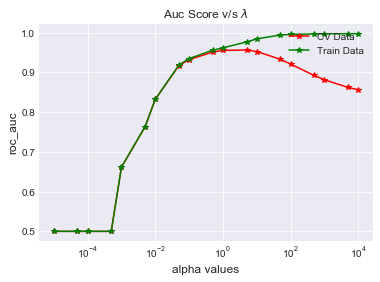

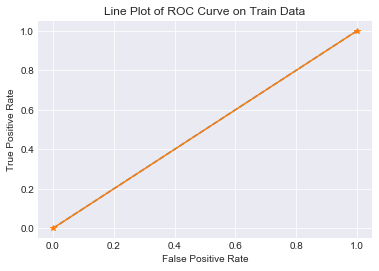

In [122]:
# find optimal C using l1 regularization 
logistic_l1(bow_train,bow_cv,Y_tr,Y_cv)

10000  for CV data auc score is -->  0.9177646571342174  and for train data auc score is -->  0.9957718898827131
5000  for CV data auc score is -->  0.9228582967868977  and for train data auc score is -->  0.9953968759841704
1000  for CV data auc score is -->  0.9321078566985592  and for train data auc score is -->  0.994551774085449
500  for CV data auc score is -->  0.9386165341918222  and for train data auc score is -->  0.9934954369884456
100  for CV data auc score is -->  0.9503659126988239  and for train data auc score is -->  0.9889699856882173
50  for CV data auc score is -->  0.9537341602284057  and for train data auc score is -->  0.9859465110743391
10  for CV data auc score is -->  0.9578301920915766  and for train data auc score is -->  0.9771512977735065
5  for CV data auc score is -->  0.9580191948526  and for train data auc score is -->  0.973026048056298
1  for CV data auc score is -->  0.9547710043532381  and for train data auc score is -->  0.962950934909348
0.5  for 

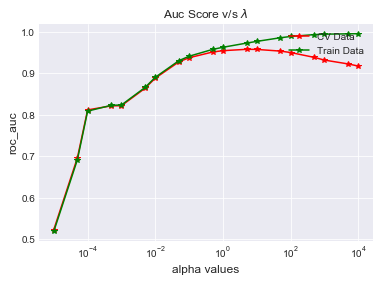

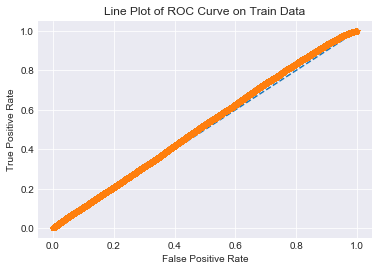

In [123]:
# find optimal C using l2 regularization 
logistic_l2(bow_train,bow_cv,Y_tr,Y_cv)

# LR simple CV Over the unseen or Test data in BoW

AUC Score 0.9763666025443755
AUC Score 0.9565382269006446
macro f1 score for data : 0.8567611513187232
micro f1 scoore for data: 0.9280977225259409
hamming loss for data: 0.0719022774740591
Precision recall report for data:
              precision    recall  f1-score   support

          0       0.81      0.71      0.76     18943
          1       0.95      0.97      0.96    101234

avg / total       0.93      0.93      0.93    120177



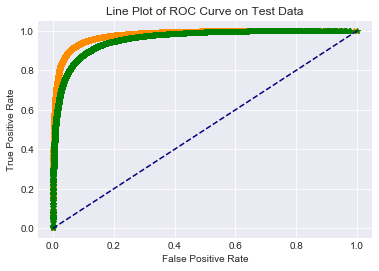

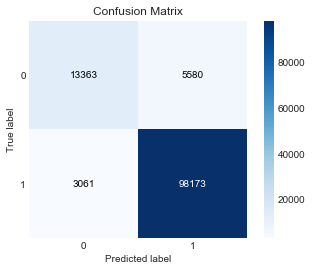

In [124]:
# optimal_C=5 for l1 regularization
testing_l1(bow_train,Y_tr,bow_test,Y_test,optimal_C=5)

AUC Score 0.973026048056298
AUC Score 0.9581572133963913
macro f1 score for data : 0.8560694059433562
micro f1 scoore for data: 0.9289880759213492
hamming loss for data: 0.07101192407865066
Precision recall report for data:
              precision    recall  f1-score   support

          0       0.83      0.69      0.75     18943
          1       0.94      0.97      0.96    101234

avg / total       0.93      0.93      0.93    120177



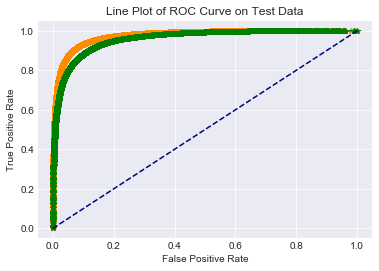

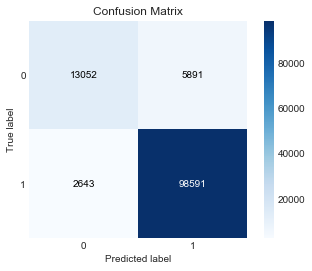

In [125]:
# optimal_C=5 for l2 regularization
testing_l2(bow_train,Y_tr,bow_test,Y_test,optimal_C=5)

In [70]:
#top 10 important feature for l1 regularization
clf1 = LogisticRegression(penalty='l1',C=5)
clf1.fit(bow_train,Y_tr)
imp_feature(count_vect,clf1)

			Negative						Positive
________________________________________________________________________________________________
	-20.7609	verytasty      				22.8478	pleasantly     
	-20.4963	deceptive      				22.5536	scoville       
	-19.5992	mattress       				15.9572	downside       
	-19.3819	thrash         				15.8895	skeptical      
	-18.8507	embarrassed    				15.8018	coon           
	-18.8078	unappealing    				15.2655	lyles          
	-18.4530	worst          				15.2246	chill          
	-17.9769	nome           				15.1310	reservation    
	-17.8102	lawsuit        				14.8338	thankful       
	-17.5692	undrinkable    				14.6914	hydrated       


In [71]:
#top 10 important feature for l2 regularization
clf2 = LogisticRegression(penalty='l2',C=5)
clf2.fit(bow_train,Y_tr)
imp_feature(count_vect,clf2)

			Negative						Positive
________________________________________________________________________________________________
	-14.8077	worst          				10.4203	delicious      
	-13.6182	disappointing  				10.2292	pleasantly     
	-13.3558	disappointment 				9.7546	perfect        
	-11.1657	terrible       				8.8724	highly         
	-10.9025	awful          				8.7397	excellent      
	-9.7827	threw          				8.6546	amazing        
	-9.6480	horrible       				8.2612	hooked         
	-9.4791	hopes          				8.1443	beat           
	-9.3406	tasteless      				7.8068	pleased        
	-8.5563	yuck           				7.7783	skeptical      


#### [5.1.1.1] Calculating sparsity on weight vector obtained using L1 regularization on BOW,<font color='red'> SET 1</font>

In [72]:
def sparsity(train_data,Y_train,test_data,Y_test):
    C_value = [1000,100,10,1,0.1,0.01,0.001,0.0001]
    for i in C_value[-8:]:
        lr = LogisticRegression(C=i,penalty='l1')
        lr.fit(train_data,Y_train)
        pred = lr.predict(test_data)
        print("C_value = ",i ," and l1_value = l1" )
        print("roc_auc score on test set: %0.3f%%"%(roc_auc_score(Y_test,pred)*100))
        print("Non Zero weights:",np.count_nonzero(lr.coef_))
        print("=+=+"*30)

In [73]:
sparsity(bow_train,Y_tr,bow_test,Y_test)

C_value =  1000  and l1_value = l1
roc_auc score on test set: 79.437%
Non Zero weights: 31048
=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+
C_value =  100  and l1_value = l1
roc_auc score on test set: 82.002%
Non Zero weights: 23428
=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+
C_value =  10  and l1_value = l1
roc_auc score on test set: 83.880%
Non Zero weights: 10941
=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+
C_value =  1  and l1_value = l1
roc_auc score on test set: 82.315%
Non Zero weights: 2025
=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+
C_value =  0.1  and l1_value = l1
roc_auc score on test set: 74.968%
Non Zero weights: 393
=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+

# Pertubation Test on BoW

In [75]:
from scipy.sparse import find
logreg1 = LogisticRegression(C= 5, penalty= 'l2')
logreg1.fit(bow_train,Y_tr)
weights1 = find(logreg1.coef_[0])[2]  #Weights before adding random noise
print("Non Zero weights:",np.count_nonzero(logreg1.coef_))

Non Zero weights: 77052


In [76]:
bow_train_noise = bow_train
#Random noise
epsilon = np.random.uniform(low=-0.00001, high=0.00001, size=(find(bow_train_noise)[0].size))
a,b,c = find(bow_train)
bow_train_noise[a,b] = epsilon + bow_train[a,b]

In [77]:

logreg2 = LogisticRegression(C= 5, penalty= 'l2')
logreg2.fit(bow_train_noise,Y_tr)
print("Non Zero weights:",np.count_nonzero(logreg2.coef_))
weights2 = find(logreg2.coef_[0])[2]  #Weights after adding random noise

Non Zero weights: 77052


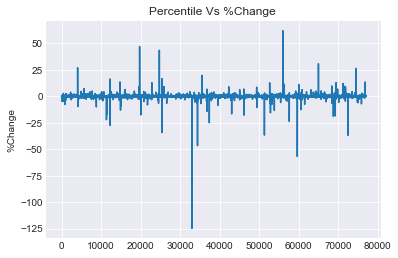

In [85]:
percentage_change_vector = (abs(weights1 - weights2)/weights1) * 100
plt.plot(percentage_change_vector)
plt.ylabel('%Change')
plt.title('Percentile Vs %Change ')
plt.show()

In [86]:
print(percentage_change_vector[np.where(percentage_change_vector > 10)].size)

17


# Top 10 Collinear feature after Pertubation test

In [88]:
index = np.argsort(np.abs(weights1 - weights2))[::-1]
features = count_vect.get_feature_names()
features = np.array(features)
a = features[index]
print(a[:10])

['bit' 'thamk' 'skip' 'adverage' 'ic' 'hopes' 'inferior' 'trifles'
 'thrash' 'ovaeasy']


# TF-IDF

In [126]:
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2))
tfidf_train = tf_idf_vect.fit_transform(X_tr)
print("The type of count vectorizer ",type(tfidf_train))
print("The shape of out text TFIDF vectorizer ",tfidf_train.get_shape())
tfidf_cv = tf_idf_vect.transform(X_cv)
tfidf_test = tf_idf_vect.transform(X_test)
print("CV Data Size: ",tfidf_cv.shape)
print("Test Data Size: ",tfidf_test.shape)


The type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
The shape of out text TFIDF vectorizer  (163475, 2241966)
CV Data Size:  (80519, 2241966)
Test Data Size:  (120177, 2241966)


In [127]:
#Normalize Data
from sklearn import preprocessing
from sklearn.preprocessing import Normalizer
tfidf_train=preprocessing.normalize(tfidf_train)
tfidf_cv=preprocessing.normalize(tfidf_cv)
tfidf_test=preprocessing.normalize(tfidf_test)
print("The shape of out text BOW vectorizer ",tfidf_train.get_shape())
print("CV Data Size: ",tfidf_cv.shape)
print("Test Data Size: ",tfidf_test.shape)

The shape of out text BOW vectorizer  (163475, 2241966)
CV Data Size:  (80519, 2241966)
Test Data Size:  (120177, 2241966)


10000  for CV data auc score is -->  0.9618489654559422  and for train data auc score is -->  0.9999963214694778
5000  for CV data auc score is -->  0.9623577755688983  and for train data auc score is -->  0.9999963214694778
1000  for CV data auc score is -->  0.9638692371798849  and for train data auc score is -->  0.9999963214694778
500  for CV data auc score is -->  0.9636182811687666  and for train data auc score is -->  0.9999963214694778
100  for CV data auc score is -->  0.9634868041224727  and for train data auc score is -->  0.9999957379218019
50  for CV data auc score is -->  0.9642021471520364  and for train data auc score is -->  0.999957914349075
10  for CV data auc score is -->  0.9668652557374677  and for train data auc score is -->  0.999734401007564
5  for CV data auc score is -->  0.9688293853514832  and for train data auc score is -->  0.9947144638364804
1  for CV data auc score is -->  0.9634052652428797  and for train data auc score is -->  0.9685848198721965
0.5  

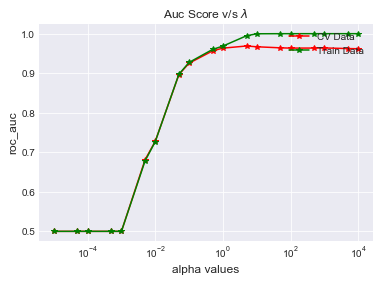

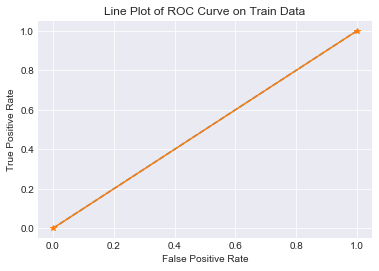

In [128]:
# find optimal_C using l1 regularization
logistic_l1(tfidf_train,tfidf_cv,Y_tr,Y_cv)

10000  for CV data auc score is -->  0.9709659332296431  and for train data auc score is -->  0.9999962866434884
5000  for CV data auc score is -->  0.97101796732311  and for train data auc score is -->  0.9999962857940741
1000  for CV data auc score is -->  0.9712049017122092  and for train data auc score is -->  0.9999962849446596
500  for CV data auc score is -->  0.9713395628083671  and for train data auc score is -->  0.9999956906377349
100  for CV data auc score is -->  0.9718350539662859  and for train data auc score is -->  0.999956892220443
50  for CV data auc score is -->  0.9718779222642138  and for train data auc score is -->  0.9999344110533046
10  for CV data auc score is -->  0.9713885998731275  and for train data auc score is -->  0.9998117417437136
5  for CV data auc score is -->  0.9706021882174269  and for train data auc score is -->  0.9990201402094333
1  for CV data auc score is -->  0.9652961365002775  and for train data auc score is -->  0.9872061690927498
0.5  f

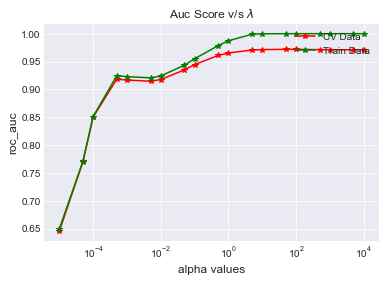

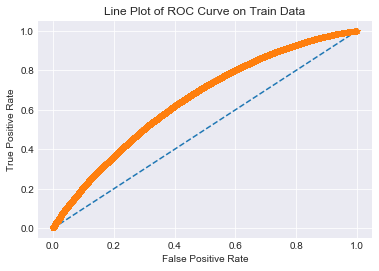

In [129]:
# find optimal_C using l2 regularization
logistic_l2(tfidf_train,tfidf_cv,Y_tr,Y_cv)

# Logistic Regression Over the unseen or Test data in TF-IDF

AUC Score 0.9947145181990004
AUC Score 0.9686596191989425
macro f1 score for data : 0.8833296688597994
micro f1 scoore for data: 0.9400384432961382
hamming loss for data: 0.0599615567038618
Precision recall report for data:
              precision    recall  f1-score   support

          0       0.84      0.77      0.80     18943
          1       0.96      0.97      0.96    101234

avg / total       0.94      0.94      0.94    120177



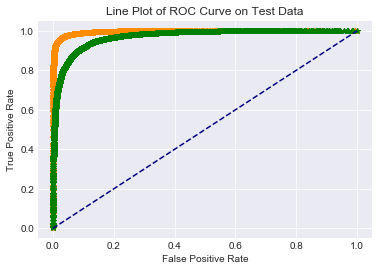

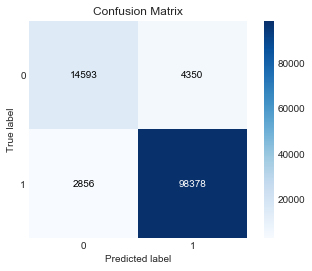

In [130]:
testing_l1(tfidf_train,Y_tr,tfidf_test,Y_test,optimal_C=5)

AUC Score 0.9999344110533046
AUC Score 0.972004740653584
macro f1 score for data : 0.8860776980265641
micro f1 scoore for data: 0.9429008878570775
hamming loss for data: 0.05709911214292252
Precision recall report for data:
              precision    recall  f1-score   support

          0       0.87      0.75      0.81     18943
          1       0.95      0.98      0.97    101234

avg / total       0.94      0.94      0.94    120177



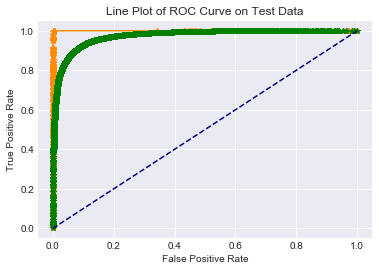

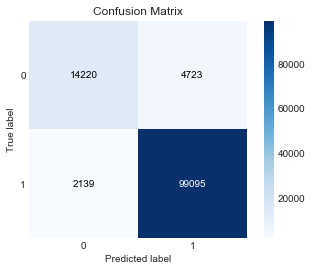

In [131]:
testing_l2(tfidf_train,Y_tr,tfidf_test,Y_test,optimal_C=50)

In [96]:
clf1=LogisticRegression(penalty='l1',C=5)
clf1.fit(tfidf_train,Y_tr)
imp_feature(tf_idf_vect,clf1)

			Negative						Positive
________________________________________________________________________________________________
	-53.8849	two stars      				39.2878	not disappointed
	-33.6487	great strength 				34.9987	delicious      
	-33.3007	wanted like    				33.8910	great          
	-30.7574	not worth      				30.2209	perfect        
	-30.3322	not recommend  				28.2921	four stars     
	-29.5098	no thanks      				26.9497	best           
	-29.0162	disappointed   				26.3758	good           
	-28.5398	worst          				24.5539	pleasantly surprised
	-28.2912	rather iced    				24.0151	excellent      
	-28.2322	disappointment 				23.6740	never disappointed


In [97]:
clf2=LogisticRegression(penalty='l2',C=50)
clf2.fit(tfidf_train,Y_tr)
imp_feature(tf_idf_vect,clf2)

			Negative						Positive
________________________________________________________________________________________________
	-28.2581	disappointed   				33.9787	great          
	-27.5421	worst          				31.3326	delicious      
	-25.3006	not worth      				25.8766	not disappointed
	-25.2706	disappointing  				25.8535	best           
	-24.9045	not recommend  				25.6850	perfect        
	-23.4328	terrible       				24.2982	good           
	-23.2047	disappointment 				22.0637	excellent      
	-23.1985	not good       				19.8906	wonderful      
	-21.9575	awful          				18.4151	amazing        
	-21.2778	two stars      				18.2722	happy          


# Working with word2vec

# Preparing Reviews for gensim model

In [81]:
i=0
list_of_sentance_train=[]
for sentance in X_tr:
    list_of_sentance_train.append(sentance.split())

# Training w2v model

In [82]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors

In [83]:
# this line of code trains your w2v model on the give list of sentances
w2v_model=Word2Vec(list_of_sentance_train,min_count=5,size=50, workers=4)

In [84]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 5 times  23535
sample words  ['worst', 'soup', 'ever', 'much', 'sugar', 'remembering', 'makes', 'go', 'sick', 'tummy', 'guess', 'stick', 'buying', 'generally', 'buy', 'safeway', 'awfully', 'sweet', 'unpalatable', 'not', 'taste', 'like', 'fresh', 'pad', 'thai', 'noodles', 'still', 'delicious', 'tanginess', 'tamarind', 'add', 'teaspoon', 'crunchy', 'peanut', 'butter', 'final', 'stir', 'kicks', 'richness', 'bit', 'love', 'individual', 'size', 'rolls', 'worry', 'refrigerating', 'cut', 'roll', 'little', 'pieces']


# Avg W2V

# Converting Reviews into Numerical Vectors using W2V vectors

# Algorithm: Avg W2V

In [85]:
from tqdm import tqdm
import numpy as np

# Converting Train data text

In [86]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors_train = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance_train): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors_train.append(sent_vec)
sent_vectors_train = np.array(sent_vectors_train)
print(sent_vectors_train.shape)
print(sent_vectors_train[0])


  3%|▎         | 5537/163475 [00:36<21:43, 121.16it/s]


  6%|▋         | 10472/163475 [01:13<25:09, 101.38it/s]


  9%|▉         | 15177/163475 [01:48<20:22, 121.28it/s]


 12%|█▏        | 19483/163475 [02:25<17:06, 140.21it/s]


 15%|█▍        | 23781/163475 [03:01<18:14, 127.58it/s]


 18%|█▊        | 28825/163475 [03:36<32:06, 69.88it/s] 


 21%|██        | 33585/163475 [04:12<16:47, 128.97it/s]


 23%|██▎       | 38298/163475 [04:49<20:57, 99.57it/s]


 26%|██▋       | 43200/163475 [05:24<15:41, 127.70it/s]


 29%|██▉       | 47377/163475 [06:02<24:50, 77.92it/s]


 32%|███▏      | 52148/163475 [06:37<12:44, 145.67it/s]


 35%|███▍      | 56559/163475 [07:15<23:37, 75.44it/s]


 37%|███▋      | 61220/163475 [07:51<15:02, 113.27it/s]


 40%|████      | 66127/163475 [08:27<14:03, 115.38it/s]


 44%|████▎     | 71234/163475 [09:02<11:26, 134.33it/s]


 47%|████▋     | 76226/163475 [09:38<09:06, 159.78it/s]


 50%|████▉     | 81125/163475 [10:14<09:07, 150.29it/s]


 53%|█████▎    | 86041/163475 [10:51<11:25, 112.94it/s]


 56%|█████▌    | 90924/163475 [11:27<12:06, 99.87it/s] 


 59%|█████▊    | 95770/163475 [12:02<07:21, 153.26it/s]


 61%|██████    | 99950/163475 [12:39<11:24, 92.80it/s]


 63%|██████▎   | 103467/163475 [13:18<11:12, 89.24it/s]


 66%|██████▌   | 107868/163475 [13:54<08:22, 110.65it/s]


 69%|██████▉   | 112781/163475 [14:29<06:58, 121.22it/s]


 72%|███████▏  | 116948/163475 [15:06<10:05, 76.86it/s]


 74%|███████▍  | 121540/163475 [15:42<05:49, 120.01it/s]


 77%|███████▋  | 125626/163475 [16:18<05:59, 105.28it/s]


 80%|███████▉  | 130197/163475 [16:54<03:42, 149.33it/s]


 82%|████████▏ | 133992/163475 [17:32<03:51, 127.26it/s]


 85%|████████▍ | 138634/163475 [18:07<03:22, 122.85it/s]


 88%|████████▊ | 143150/163475 [18:42<03:09, 107.46it/s]


 90%|█████████ | 147777/163475 [19:17<02:15, 115.79it/s]


 93%|█████████▎| 152211/163475 [19:52<02:45, 68.20it/s] 


 96%|█████████▌| 156661/163475 [20:28<00:58, 115.76it/s]


 99%|█████████▊| 161230/163475 [21:03<00:13, 172.38it/s]


100%|██████████| 163475/163475 [21:20<00:00, 127.66it/s]

(163475, 50)
[ 0.59584627 -1.20290594 -0.56962021 -0.12116147 -0.02045891  0.66127477
 -0.56815588  0.05393946 -0.13381205 -0.80884072 -0.47834443 -0.42367917
 -0.1233876   0.04621408  0.52590364  0.830571    0.68813575 -0.65154816
  0.76421086  0.64491675  0.26273819 -0.70003036 -0.87335458 -0.21552979
  0.46442881 -0.0226293  -0.95830472 -0.36529377  0.24373341  0.15034784
  0.06553838 -0.61419556 -0.2063876   0.12701177 -0.31635744  0.11825677
 -0.09289534 -0.77014017  0.1236629   1.01377278 -0.44376123 -0.08563771
 -0.64594354 -0.08480114  0.87582786 -0.40878287  0.6150851   0.33986564
 -0.06237312  0.23216187]


# Converting CV data text

In [43]:
i=0
list_of_sentance_cv=[]
for sentance in X_cv:
    list_of_sentance_cv.append(sentance.split())

In [44]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors_cv = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance_cv): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors_cv.append(sent_vec)
sent_vectors_cv = np.array(sent_vectors_cv)
print(sent_vectors_cv.shape)
print(sent_vectors_cv[0])

100%|██████████| 80519/80519 [07:52<00:00, 170.54it/s]


(80519, 50)
[-0.23630953 -0.15764741 -0.45580933 -0.0857438  -0.12027711 -0.29373519
 -0.69836357 -0.37131124  0.51424202  0.11287925 -0.93952744  0.23272125
  0.20223512 -0.98464972  0.68767115  0.83059     0.4071628   0.4043956
 -0.07656631 -0.14552595  0.03374348 -0.15886163  0.07129767  0.37491366
 -0.38337408 -0.59502741 -0.34748336 -0.319286    0.12662574 -0.51776885
  0.73546405 -0.24740469  0.04701688  0.89332737 -0.6708107   0.19396324
 -0.70647179 -0.38174529  0.53726104  0.24764472 -0.65073272 -0.27263675
  0.32562323 -0.1359019  -0.35391434  0.14392293 -0.35838907 -0.00706661
  0.44748637 -0.18430013]


# Converting Test data text

In [45]:
i=0
list_of_sentance_test=[]
for sentance in X_test:
    list_of_sentance_test.append(sentance.split())

In [46]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance_test): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors_test.append(sent_vec)
sent_vectors_test = np.array(sent_vectors_test)
print(sent_vectors_test.shape)
print(sent_vectors_test[0])

100%|██████████| 120177/120177 [11:48<00:00, 169.52it/s]


(120177, 50)
[ 0.3682589  -0.26585959 -0.80323109 -1.34686356 -0.49062624  0.32282951
 -0.1220367   1.15675126  0.52712699 -0.45334991  0.22349855 -0.18240635
  0.24125669 -0.32660102 -0.14614465  0.09152282  0.17673497 -0.61236313
 -0.00448281 -0.40608427  0.48149021 -0.83567413 -0.44427658  1.15761499
  0.32851466 -0.10359561  0.51606744  0.45280914  0.2452846  -0.56378139
  0.06070574  0.34250891 -0.07639216 -0.04101486 -0.15731841 -0.18202841
 -0.09111401  0.37374244  0.10098203  0.20291001 -1.01396451  0.15584724
  0.78863963  0.3705341  -0.19290103 -0.41138454  0.4254688   0.33931866
  0.22082883 -0.63015809]


In [132]:
from sklearn import preprocessing
from sklearn.preprocessing import Normalizer
normalizer = preprocessing.Normalizer()
train_avgw2v = normalizer.fit_transform(sent_vectors_train)
cv_avgw2v = normalizer.transform(sent_vectors_cv)
test_avgw2v = normalizer.transform(sent_vectors_test)

10000  for CV data auc score is -->  0.8596728950238729  and for train data auc score is -->  0.9184120402109367
5000  for CV data auc score is -->  0.8597864033822129  and for train data auc score is -->  0.9184085978176109
1000  for CV data auc score is -->  0.8596776696329855  and for train data auc score is -->  0.9184118482432879
500  for CV data auc score is -->  0.8596715782542184  and for train data auc score is -->  0.9184120540847049
100  for CV data auc score is -->  0.8596684158964635  and for train data auc score is -->  0.918412287107382
50  for CV data auc score is -->  0.859676239126326  and for train data auc score is -->  0.9184122454860775
10  for CV data auc score is -->  0.859689138309737  and for train data auc score is -->  0.9184131212322987
5  for CV data auc score is -->  0.8597132271038462  and for train data auc score is -->  0.9184144347100613
1  for CV data auc score is -->  0.8598700094611835  and for train data auc score is -->  0.9184225553946292
0.5  f

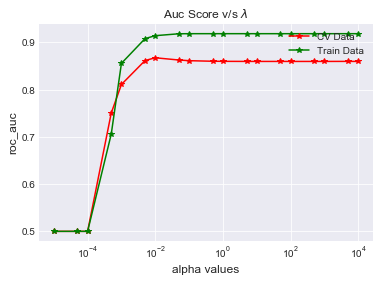

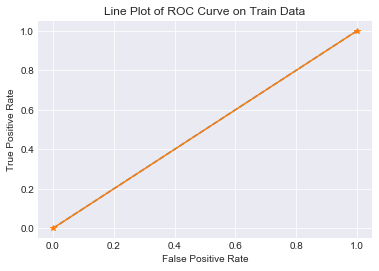

In [133]:
# find optimal_C using l1 regularization
logistic_l1(train_avgw2v,cv_avgw2v,Y_tr,Y_cv)

10000  for CV data auc score is -->  0.8597699267596067  and for train data auc score is -->  0.9184101596075095
5000  for CV data auc score is -->  0.8597700686377263  and for train data auc score is -->  0.918410165270272
1000  for CV data auc score is -->  0.8597711591059176  and for train data auc score is -->  0.9184101145885475
500  for CV data auc score is -->  0.8597724676677471  and for train data auc score is -->  0.9184101185524812
100  for CV data auc score is -->  0.8597834825690254  and for train data auc score is -->  0.9184102473803282
50  for CV data auc score is -->  0.8597967534496586  and for train data auc score is -->  0.9184104653966846
10  for CV data auc score is -->  0.8599038303907631  and for train data auc score is -->  0.9184124244293725
5  for CV data auc score is -->  0.8600372438975067  and for train data auc score is -->  0.9184149276535374
1  for CV data auc score is -->  0.8610461966601177  and for train data auc score is -->  0.9184350565091317
0.5 

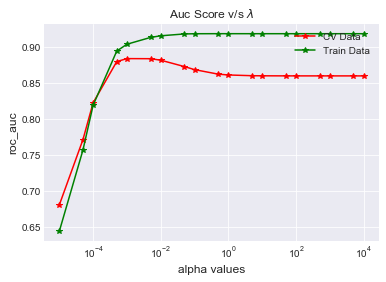

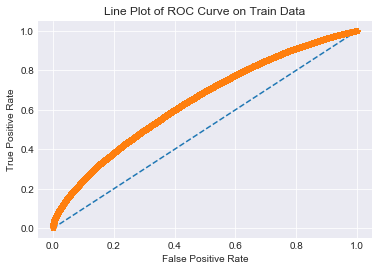

In [134]:
# find optimal_C using l2 regularization
logistic_l2(train_avgw2v,cv_avgw2v,Y_tr,Y_cv)

AUC Score 0.9184291380729013
AUC Score 0.8587043091440142
macro f1 score for data : 0.7084340218051193
micro f1 scoore for data: 0.8089900729756941
hamming loss for data: 0.1910099270243058
Precision recall report for data:
              precision    recall  f1-score   support

          0       0.43      0.70      0.54     18943
          1       0.94      0.83      0.88    101234

avg / total       0.86      0.81      0.83    120177



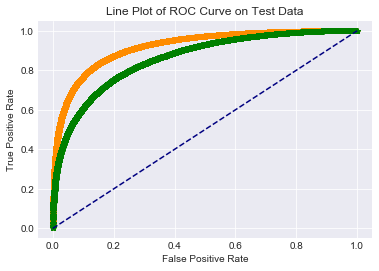

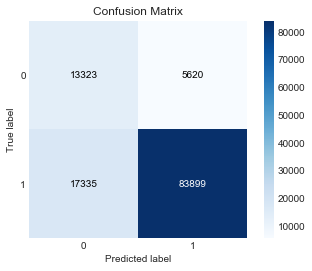

In [135]:
testing_l1(train_avgw2v,Y_tr,test_avgw2v,Y_test,optimal_C=0.5)

AUC Score 0.9184462362180041
AUC Score 0.8607555407875849
macro f1 score for data : 0.7137202798193335
micro f1 scoore for data: 0.8163292476929862
hamming loss for data: 0.18367075230701382
Precision recall report for data:
              precision    recall  f1-score   support

          0       0.45      0.69      0.54     18943
          1       0.94      0.84      0.89    101234

avg / total       0.86      0.82      0.83    120177



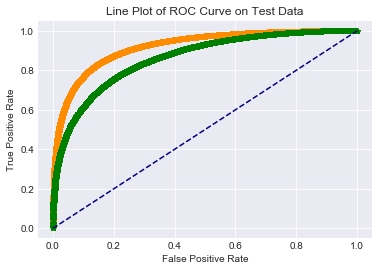

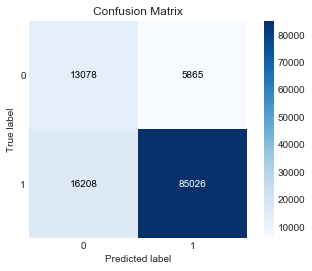

In [136]:
testing_l2(train_avgw2v,Y_tr,test_avgw2v,Y_test,optimal_C=0.5)

# TF-IDF Weighted W2V

In [93]:
tf_idf_vect = TfidfVectorizer()
tfidf_train = tf_idf_vect.fit_transform(X_tr)
print("The type of count vectorizer ",type(tfidf_train))
print("The shape of out text TFIDF vectorizer ",tfidf_train.get_shape())
tfidf_cv = tf_idf_vect.transform(X_cv)
tfidf_test = tf_idf_vect.transform(X_test)
print("CV Data Size: ",tfidf_cv.shape)
print("Test Data Size: ",tfidf_test.shape)

The type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
The shape of out text TFIDF vectorizer  (163475, 77052)
CV Data Size:  (80519, 77052)
Test Data Size:  (120177, 77052)


In [96]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
model = TfidfVectorizer()
tf_idf_matrix = model.fit_transform(X_tr)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))

In [97]:
from tqdm import tqdm
import numpy as np
# TF-IDF weighted Word2Vec
tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors_train = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sentance_train): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors_train.append(sent_vec)
    row += 1


  0%|          | 602/163475 [01:05<5:32:54,  8.15it/s]


  1%|          | 1174/163475 [02:06<9:51:36,  4.57it/s]


  1%|          | 1665/163475 [03:13<4:55:56,  9.11it/s]


  1%|▏         | 2226/163475 [04:16<3:26:45, 13.00it/s]


  2%|▏         | 2787/163475 [05:20<5:31:44,  8.07it/s]


  2%|▏         | 3337/163475 [06:23<4:43:38,  9.41it/s]


  2%|▏         | 3822/163475 [07:29<3:59:43, 11.10it/s]


  3%|▎         | 4297/163475 [08:36<6:36:33,  6.69it/s]


  3%|▎         | 4751/163475 [09:42<11:18:31,  3.90it/s]


  3%|▎         | 5234/163475 [10:46<11:11:37,  3.93it/s]


  4%|▎         | 5781/163475 [11:51<4:42:10,  9.31it/s]


  4%|▍         | 6304/163475 [12:59<6:26:42,  6.77it/s]


  4%|▍         | 6844/163475 [14:04<6:24:01,  6.80it/s]


  5%|▍         | 7384/163475 [15:11<6:18:09,  6.88it/s]


  5%|▍         | 7878/163475 [16:21<8:05:18,  5.34it/s]


  5%|▌         | 8397/163475 [17:26<4:17:05, 10.05it/s]


  5%|▌         | 8889/163475 [18:35<6:39:15,  6.45it/s]


  6%|▌         | 9409/163475 [19:41<4:32:04,  9.44it/s]


  6%|▌         | 9924/163475 [20:50<6:09:32,  6.93it/s]


  6%|▋         | 10420/163475 [21:55<10:38:07,  4.00it/s]


  7%|▋         | 10940/163475 [22:58<4:29:59,  9.42it/s]


  7%|▋         | 11439/163475 [24:07<6:21:25,  6.64it/s]


  7%|▋         | 11985/163475 [25:10<6:01:07,  6.99it/s]


  8%|▊         | 12466/163475 [26:19<7:39:58,  5.47it/s]


  8%|▊         | 12961/163475 [27:24<4:02:24, 10.35it/s]


  8%|▊         | 13485/163475 [28:26<5:07:39,  8.13it/s]


  9%|▊         | 13953/163475 [29:34<7:37:02,  5.45it/s]


  9%|▉         | 14471/163475 [30:36<5:15:37,  7.87it/s]


  9%|▉         | 15020/163475 [31:41<3:20:33, 12.34it/s]


 10%|▉         | 15537/163475 [32:42<6:30:08,  6.32it/s]


 10%|▉         | 15999/163475 [33:49<6:28:26,  6.33it/s]


 10%|█         | 16520/163475 [34:51<5:51:43,  6.96it/s]


 10%|█         | 17057/163475 [35:57<5:07:35,  7.93it/s]


 11%|█         | 17580/163475 [37:00<5:01:44,  8.06it/s]


 11%|█         | 18129/163475 [38:08<4:14:32,  9.52it/s]


 11%|█▏        | 18667/163475 [39:16<3:14:48, 12.39it/s]


 12%|█▏        | 19186/163475 [40:18<3:30:36, 11.42it/s]


 12%|█▏        | 19677/163475 [41:19<5:52:25,  6.80it/s]


 12%|█▏        | 20132/163475 [42:23<6:12:59,  6.41it/s]


 13%|█▎        | 20600/163475 [43:26<5:53:07,  6.74it/s]


 13%|█▎        | 21097/163475 [44:29<5:36:41,  7.05it/s]


 13%|█▎        | 21607/163475 [45:32<7:07:40,  5.53it/s]


 14%|█▎        | 22119/163475 [46:36<8:10:50,  4.80it/s]


 14%|█▍        | 22616/163475 [47:40<7:41:13,  5.09it/s]


 14%|█▍        | 23118/163475 [48:45<7:21:04,  5.30it/s]


 14%|█▍        | 23601/163475 [49:46<10:45:18,  3.61it/s]


 15%|█▍        | 24124/163475 [50:48<5:06:35,  7.58it/s]


 15%|█▌        | 24655/163475 [51:50<5:57:03,  6.48it/s]


 15%|█▌        | 25150/163475 [52:54<6:33:59,  5.85it/s]


 16%|█▌        | 25642/163475 [53:59<9:35:30,  3.99it/s]


 16%|█▌        | 26087/163475 [55:00<3:52:33,  9.85it/s]


 16%|█▋        | 26581/163475 [56:02<6:43:40,  5.65it/s]


 17%|█▋        | 27088/163475 [57:05<6:44:18,  5.62it/s]


 17%|█▋        | 27580/163475 [58:09<5:53:32,  6.41it/s]


 17%|█▋        | 28070/163475 [59:19<9:35:35,  3.92it/s] 


 17%|█▋        | 28243/163475 [59:56<5:49:12,  6.45it/s]


 18%|█▊        | 28615/163475 [1:01:01<6:25:05,  5.84it/s]


 18%|█▊        | 29001/163475 [1:02:10<4:02:39,  9.24it/s]


 18%|█▊        | 29436/163475 [1:03:11<5:34:53,  6.67it/s]


 18%|█▊        | 29832/163475 [1:04:17<12:11:08,  3.05it/s]


 18%|█▊        | 30226/163475 [1:05:20<4:33:24,  8.12it/s]


 19%|█▉        | 30662/163475 [1:06:26<9:31:34,  3.87it/s]


 19%|█▉        | 31068/163475 [1:07:32<5:30:53,  6.67it/s]


 19%|█▉        | 31496/163475 [1:08:40<6:52:29,  5.33it/s]


 20%|█▉        | 31933/163475 [1:09:42<5:06:30,  7.15it/s]


 20%|█▉        | 32396/163475 [1:10:47<10:24:12,  3.50it/s]


 20%|██        | 32830/163475 [1:11:47<4:35:39,  7.90it/s]


 20%|██        | 33245/163475 [1:12:50<4:23:44,  8.23it/s]


 21%|██        | 33697/163475 [1:13:53<4:05:26,  8.81it/s]


 21%|██        | 34089/163475 [1:14:56<8:29:40,  4.23it/s]


 21%|██        | 34480/163475 [1:16:00<8:33:40,  4.19it/s]


 21%|██▏       | 34921/163475 [1:17:05<5:25:15,  6.59it/s]


 22%|██▏       | 35328/163475 [1:18:09<6:42:21,  5.31it/s]


 22%|██▏       | 35741/163475 [1:19:12<5:07:47,  6.92it/s]


 22%|██▏       | 36173/163475 [1:20:13<5:22:30,  6.58it/s]


 22%|██▏       | 36591/163475 [1:21:16<3:55:00,  9.00it/s]


 23%|██▎       | 37011/163475 [1:22:19<6:55:43,  5.07it/s]


 23%|██▎       | 37434/163475 [1:23:21<7:19:45,  4.78it/s]


 23%|██▎       | 37859/163475 [1:24:25<4:20:55,  8.02it/s]


 23%|██▎       | 38272/163475 [1:25:28<6:48:12,  5.11it/s]


 24%|██▎       | 38666/163475 [1:26:30<6:45:43,  5.13it/s]


 24%|██▍       | 39092/163475 [1:27:32<6:10:19,  5.60it/s]


 24%|██▍       | 39513/163475 [1:28:36<7:45:23,  4.44it/s]


 24%|██▍       | 39881/163475 [1:29:49<6:13:32,  5.51it/s]


 25%|██▍       | 40256/163475 [1:30:54<7:23:58,  4.63it/s]


 25%|██▍       | 40642/163475 [1:32:00<4:03:43,  8.40it/s]


 25%|██▌       | 41063/163475 [1:33:05<3:13:52, 10.52it/s]


 25%|██▌       | 41539/163475 [1:34:07<4:35:36,  7.37it/s]


 26%|██▌       | 41989/163475 [1:35:12<5:49:55,  5.79it/s]


 26%|██▌       | 42438/163475 [1:36:11<4:03:53,  8.27it/s]


 26%|██▌       | 42901/163475 [1:37:13<12:46:32,  2.62it/s]


 27%|██▋       | 43362/163475 [1:38:17<6:08:34,  5.43it/s]


 27%|██▋       | 43875/163475 [1:39:19<4:50:05,  6.87it/s]


 27%|██▋       | 44370/163475 [1:40:19<2:52:24, 11.51it/s]


 27%|██▋       | 44851/163475 [1:41:22<4:15:26,  7.74it/s]


 28%|██▊       | 45348/163475 [1:42:25<3:58:39,  8.25it/s]


 28%|██▊       | 45842/163475 [1:43:28<2:48:51, 11.61it/s]


 28%|██▊       | 46315/163475 [1:44:30<5:15:18,  6.19it/s]


 29%|██▊       | 46776/163475 [1:45:33<3:31:05,  9.21it/s]


 29%|██▉       | 47252/163475 [1:46:35<3:10:25, 10.17it/s]


 29%|██▉       | 47741/163475 [1:47:41<3:45:34,  8.55it/s]


 29%|██▉       | 48220/163475 [1:48:44<4:27:02,  7.19it/s]


 30%|██▉       | 48708/163475 [1:49:47<4:25:11,  7.21it/s]


 30%|███       | 49178/163475 [1:50:47<9:41:04,  3.28it/s]


 30%|███       | 49659/163475 [1:51:51<5:50:11,  5.42it/s]


 31%|███       | 50147/163475 [1:52:55<3:18:59,  9.49it/s]


 31%|███       | 50640/163475 [1:53:59<3:30:07,  8.95it/s]


 31%|███▏      | 51129/163475 [1:54:59<2:51:01, 10.95it/s]


 32%|███▏      | 51609/163475 [1:55:59<4:17:42,  7.23it/s]


 32%|███▏      | 52061/163475 [1:57:00<6:10:42,  5.01it/s]


 32%|███▏      | 52553/163475 [1:58:01<2:15:23, 13.65it/s]


 32%|███▏      | 53013/163475 [1:59:06<3:40:18,  8.36it/s]


 33%|███▎      | 53500/163475 [2:00:08<6:08:30,  4.97it/s]


 33%|███▎      | 53991/163475 [2:01:08<3:09:20,  9.64it/s]


 33%|███▎      | 54490/163475 [2:02:09<3:19:11,  9.12it/s]


 34%|███▎      | 54995/163475 [2:03:08<3:22:52,  8.91it/s]


 34%|███▍      | 55459/163475 [2:04:09<3:56:03,  7.63it/s]


 34%|███▍      | 55958/163475 [2:05:12<4:54:22,  6.09it/s]


 35%|███▍      | 56436/163475 [2:06:14<3:42:57,  8.00it/s]


 35%|███▍      | 56931/163475 [2:07:15<2:46:25, 10.67it/s]


 35%|███▌      | 57411/163475 [2:08:16<3:42:10,  7.96it/s]


 35%|███▌      | 57879/163475 [2:09:16<3:07:53,  9.37it/s]


 36%|███▌      | 58377/163475 [2:10:21<2:51:30, 10.21it/s]


 36%|███▌      | 58873/163475 [2:11:25<8:36:16,  3.38it/s]


 36%|███▋      | 59340/163475 [2:12:27<4:16:32,  6.77it/s]


 37%|███▋      | 59801/163475 [2:13:30<4:48:03,  6.00it/s]


 37%|███▋      | 60282/163475 [2:14:32<3:02:59,  9.40it/s]


 37%|███▋      | 60773/163475 [2:15:33<4:01:50,  7.08it/s]


 37%|███▋      | 61248/163475 [2:16:35<3:41:01,  7.71it/s]


 38%|███▊      | 61731/163475 [2:17:39<2:26:56, 11.54it/s]


 38%|███▊      | 62209/163475 [2:18:42<4:22:34,  6.43it/s]


 38%|███▊      | 62707/163475 [2:19:47<3:00:12,  9.32it/s]


 39%|███▊      | 63221/163475 [2:20:50<2:25:42, 11.47it/s]


 39%|███▉      | 63708/163475 [2:21:50<3:10:24,  8.73it/s]


 39%|███▉      | 64204/163475 [2:22:52<3:36:50,  7.63it/s]


 40%|███▉      | 64696/163475 [2:23:54<2:46:34,  9.88it/s]


 40%|███▉      | 65170/163475 [2:24:55<3:45:13,  7.27it/s]


 40%|████      | 65637/163475 [2:25:58<3:43:44,  7.29it/s]


 40%|████      | 66071/163475 [2:26:56<2:59:20,  9.05it/s]


 41%|████      | 66544/163475 [2:27:57<4:53:48,  5.50it/s]


 41%|████      | 67017/163475 [2:28:56<4:04:12,  6.58it/s]


 41%|████▏     | 67532/163475 [2:29:57<3:48:50,  6.99it/s]


 42%|████▏     | 67989/163475 [2:30:58<4:04:41,  6.50it/s]


 42%|████▏     | 68474/163475 [2:31:57<2:45:47,  9.55it/s]


 42%|████▏     | 68993/163475 [2:32:57<2:23:03, 11.01it/s]


 42%|████▏     | 69456/163475 [2:34:00<3:19:27,  7.86it/s]


 43%|████▎     | 69931/163475 [2:35:03<9:30:10,  2.73it/s]


 43%|████▎     | 70414/163475 [2:36:02<5:15:34,  4.92it/s]


 43%|████▎     | 70907/163475 [2:37:03<3:48:05,  6.76it/s]


 44%|████▎     | 71393/163475 [2:38:04<3:34:36,  7.15it/s]


 44%|████▍     | 71880/163475 [2:39:06<3:27:21,  7.36it/s]


 44%|████▍     | 72327/163475 [2:40:10<2:29:30, 10.16it/s]


 45%|████▍     | 72802/163475 [2:41:09<3:47:18,  6.65it/s]


 45%|████▍     | 73268/163475 [2:42:10<2:42:19,  9.26it/s]


 45%|████▌     | 73775/163475 [2:43:12<2:27:16, 10.15it/s]


 45%|████▌     | 74285/163475 [2:44:18<3:46:08,  6.57it/s]


 46%|████▌     | 74777/163475 [2:45:20<2:37:49,  9.37it/s]


 46%|████▌     | 75247/163475 [2:46:23<2:58:05,  8.26it/s]


 46%|████▋     | 75729/163475 [2:47:25<4:36:28,  5.29it/s]


 47%|████▋     | 76199/163475 [2:48:29<3:47:58,  6.38it/s]


 47%|████▋     | 76686/163475 [2:49:32<3:33:49,  6.76it/s]


 47%|████▋     | 77150/163475 [2:50:34<4:25:05,  5.43it/s]


 47%|████▋     | 77644/163475 [2:51:36<6:34:13,  3.63it/s]


 48%|████▊     | 78139/163475 [2:52:36<2:25:43,  9.76it/s]


 48%|████▊     | 78630/163475 [2:53:37<8:52:05,  2.66it/s]


 48%|████▊     | 79101/163475 [2:54:40<3:57:31,  5.92it/s]


 49%|████▊     | 79559/163475 [2:55:42<4:08:10,  5.64it/s]


 49%|████▉     | 80058/163475 [2:56:46<2:43:32,  8.50it/s]


 49%|████▉     | 80548/163475 [2:57:46<2:20:34,  9.83it/s]


 50%|████▉     | 81051/163475 [2:58:46<3:26:01,  6.67it/s]


 50%|████▉     | 81540/163475 [2:59:51<4:49:44,  4.71it/s]


 50%|█████     | 82058/163475 [3:00:57<4:46:19,  4.74it/s]


 50%|█████     | 82548/163475 [3:01:57<2:52:03,  7.84it/s]


 51%|█████     | 83047/163475 [3:03:00<2:23:17,  9.35it/s]


 51%|█████     | 83503/163475 [3:04:02<3:20:55,  6.63it/s]


 51%|█████▏    | 83971/163475 [3:05:06<1:59:37, 11.08it/s]


 52%|█████▏    | 84449/163475 [3:06:07<2:04:42, 10.56it/s]


 52%|█████▏    | 84941/163475 [3:07:10<2:14:14,  9.75it/s]


 52%|█████▏    | 85432/163475 [3:08:16<2:40:07,  8.12it/s]


 53%|█████▎    | 85915/163475 [3:09:17<1:43:09, 12.53it/s]


 53%|█████▎    | 86387/163475 [3:10:22<1:57:49, 10.90it/s]


 53%|█████▎    | 86884/163475 [3:11:24<1:54:48, 11.12it/s]


 53%|█████▎    | 87355/163475 [3:12:25<2:53:30,  7.31it/s]


 54%|█████▎    | 87861/163475 [3:13:24<2:27:51,  8.52it/s]


 54%|█████▍    | 88328/163475 [3:14:28<2:34:47,  8.09it/s]


 54%|█████▍    | 88832/163475 [3:15:28<2:11:19,  9.47it/s]


 55%|█████▍    | 89338/163475 [3:16:32<1:59:51, 10.31it/s]


 55%|█████▍    | 89830/163475 [3:17:34<2:28:07,  8.29it/s]


 55%|█████▌    | 90295/163475 [3:18:38<4:55:18,  4.13it/s]


 56%|█████▌    | 90809/163475 [3:19:41<2:04:08,  9.76it/s]


 56%|█████▌    | 91286/163475 [3:20:41<2:32:27,  7.89it/s]


 56%|█████▌    | 91778/163475 [3:21:41<2:20:01,  8.53it/s]


 56%|█████▋    | 92248/163475 [3:22:43<3:46:18,  5.25it/s]


 57%|█████▋    | 92747/163475 [3:23:45<2:16:18,  8.65it/s]


 57%|█████▋    | 93234/163475 [3:24:48<2:15:40,  8.63it/s]


 57%|█████▋    | 93711/163475 [3:25:47<2:55:35,  6.62it/s]


 58%|█████▊    | 94220/163475 [3:26:48<2:28:36,  7.77it/s]


 58%|█████▊    | 94716/163475 [3:27:48<4:04:26,  4.69it/s]


 58%|█████▊    | 95181/163475 [3:28:50<2:35:32,  7.32it/s]


 59%|█████▊    | 95666/163475 [3:29:51<2:16:40,  8.27it/s]


 59%|█████▉    | 96122/163475 [3:30:54<2:22:54,  7.85it/s]


 59%|█████▉    | 96634/163475 [3:31:55<2:44:07,  6.79it/s]


 59%|█████▉    | 97113/163475 [3:32:55<2:36:06,  7.08it/s]


 60%|█████▉    | 97564/163475 [3:34:00<2:43:22,  6.72it/s]


 60%|█████▉    | 98058/163475 [3:35:01<2:33:49,  7.09it/s]


 60%|██████    | 98525/163475 [3:36:00<2:41:22,  6.71it/s]


 61%|██████    | 99009/163475 [3:37:04<5:41:42,  3.14it/s]


 61%|██████    | 99500/163475 [3:38:05<2:04:26,  8.57it/s]


 61%|██████    | 99983/163475 [3:39:08<1:54:01,  9.28it/s]


 61%|██████▏   | 100462/163475 [3:40:12<3:17:12,  5.33it/s]


 62%|██████▏   | 100966/163475 [3:41:14<2:23:59,  7.23it/s]


 62%|██████▏   | 101441/163475 [3:42:17<2:12:22,  7.81it/s]


 62%|██████▏   | 101903/163475 [3:43:18<2:37:03,  6.53it/s]


 63%|██████▎   | 102370/163475 [3:44:21<1:44:10,  9.78it/s]


 63%|██████▎   | 102886/163475 [3:45:23<1:21:06, 12.45it/s]


 63%|██████▎   | 103370/163475 [3:46:25<2:05:21,  7.99it/s]


 64%|██████▎   | 103815/163475 [3:47:29<2:22:41,  6.97it/s]


 64%|██████▍   | 104255/163475 [3:48:31<1:55:29,  8.55it/s]


 64%|██████▍   | 104713/163475 [3:49:34<3:00:39,  5.42it/s]


 64%|██████▍   | 105176/163475 [3:50:35<2:30:13,  6.47it/s]


 65%|██████▍   | 105643/163475 [3:51:36<3:38:52,  4.40it/s]


 65%|██████▍   | 106081/163475 [3:52:39<5:23:15,  2.96it/s]


 65%|██████▌   | 106566/163475 [3:53:40<2:24:35,  6.56it/s]


 65%|██████▌   | 107001/163475 [3:54:43<1:55:13,  8.17it/s]


 66%|██████▌   | 107454/163475 [3:55:45<1:30:43, 10.29it/s]


 66%|██████▌   | 107916/163475 [3:56:45<2:04:38,  7.43it/s]


 66%|██████▋   | 108362/163475 [3:57:43<2:51:00,  5.37it/s]


 67%|██████▋   | 108832/163475 [3:58:46<2:40:41,  5.67it/s]


 67%|██████▋   | 109307/163475 [3:59:49<1:38:39,  9.15it/s]


 67%|██████▋   | 109771/163475 [4:00:50<1:43:02,  8.69it/s]


 67%|██████▋   | 110246/163475 [4:01:51<2:01:48,  7.28it/s]


 68%|██████▊   | 110713/163475 [4:02:53<2:08:41,  6.83it/s]


 68%|██████▊   | 111155/163475 [4:03:55<1:36:57,  8.99it/s]


 68%|██████▊   | 111604/163475 [4:04:54<3:06:09,  4.64it/s]


 69%|██████▊   | 112075/163475 [4:05:56<1:42:47,  8.33it/s]


 69%|██████▉   | 112526/163475 [4:06:55<4:03:29,  3.49it/s]


 69%|██████▉   | 112976/163475 [4:07:58<1:25:00,  9.90it/s]


 69%|██████▉   | 113419/163475 [4:09:00<1:45:55,  7.88it/s]


 70%|██████▉   | 113878/163475 [4:10:01<2:41:58,  5.10it/s]


 70%|██████▉   | 114327/163475 [4:11:01<1:40:15,  8.17it/s]


 70%|███████   | 114798/163475 [4:12:04<1:36:35,  8.40it/s]


 70%|███████   | 115225/163475 [4:13:04<2:35:24,  5.17it/s]


 71%|███████   | 115700/163475 [4:14:05<1:46:14,  7.50it/s]


 71%|███████   | 116152/163475 [4:15:07<2:55:03,  4.51it/s]


 71%|███████▏  | 116594/163475 [4:16:07<3:45:43,  3.46it/s]


 72%|███████▏  | 117051/163475 [4:17:08<2:11:23,  5.89it/s]


 72%|███████▏  | 117487/163475 [4:18:12<1:20:17,  9.55it/s]


 72%|███████▏  | 117958/163475 [4:19:11<1:19:24,  9.55it/s]


 72%|███████▏  | 118422/163475 [4:20:12<1:16:57,  9.76it/s]


 73%|███████▎  | 118873/163475 [4:21:14<1:25:20,  8.71it/s]


 73%|███████▎  | 119312/163475 [4:22:18<3:26:27,  3.57it/s]


 73%|███████▎  | 119769/163475 [4:23:19<2:27:24,  4.94it/s]


 74%|███████▎  | 120209/163475 [4:24:23<1:53:09,  6.37it/s]


 74%|███████▍  | 120648/163475 [4:25:26<2:20:24,  5.08it/s]


 74%|███████▍  | 121086/163475 [4:26:28<2:06:03,  5.60it/s]


 74%|███████▍  | 121533/163475 [4:27:30<1:39:58,  6.99it/s]


 75%|███████▍  | 121949/163475 [4:28:30<1:18:52,  8.78it/s]


 75%|███████▍  | 122379/163475 [4:29:30<1:19:35,  8.61it/s]


 75%|███████▌  | 122799/163475 [4:30:34<1:49:43,  6.18it/s]


 75%|███████▌  | 123240/163475 [4:31:36<2:36:13,  4.29it/s]


 76%|███████▌  | 123670/163475 [4:32:39<3:04:47,  3.59it/s]


 76%|███████▌  | 124133/163475 [4:33:39<1:35:16,  6.88it/s]


 76%|███████▌  | 124575/163475 [4:34:42<1:10:03,  9.25it/s]


 76%|███████▋  | 125039/163475 [4:35:44<1:16:23,  8.39it/s]


 77%|███████▋  | 125509/163475 [4:36:44<1:59:00,  5.32it/s]


 77%|███████▋  | 125980/163475 [4:37:48<1:03:09,  9.89it/s]


 77%|███████▋  | 126403/163475 [4:38:53<1:35:38,  6.46it/s]


 78%|███████▊  | 126858/163475 [4:39:54<1:50:29,  5.52it/s]


 78%|███████▊  | 127317/163475 [4:40:56<1:51:05,  5.42it/s]


 78%|███████▊  | 127802/163475 [4:42:02<1:37:30,  6.10it/s]


 78%|███████▊  | 128276/163475 [4:43:07<2:53:44,  3.38it/s]


 79%|███████▊  | 128717/163475 [4:44:07<1:25:03,  6.81it/s]


 79%|███████▉  | 129174/163475 [4:45:07<1:17:26,  7.38it/s]


 79%|███████▉  | 129637/163475 [4:46:09<2:03:08,  4.58it/s]


 80%|███████▉  | 130078/163475 [4:47:10<54:51, 10.15it/s]


 80%|███████▉  | 130535/163475 [4:48:12<1:33:38,  5.86it/s]


 80%|████████  | 130992/163475 [4:49:17<1:24:14,  6.43it/s]


 80%|████████  | 131435/163475 [4:50:18<55:55,  9.55it/s]  


 81%|████████  | 131910/163475 [4:51:21<1:12:10,  7.29it/s]


 81%|████████  | 132387/163475 [4:52:25<1:14:21,  6.97it/s]


 81%|████████▏ | 132844/163475 [4:53:25<1:15:34,  6.76it/s]


 82%|████████▏ | 133329/163475 [4:54:28<1:03:05,  7.96it/s]


 82%|████████▏ | 133798/163475 [4:55:31<57:53,  8.54it/s]  


 82%|████████▏ | 134282/163475 [4:56:33<48:23, 10.06it/s]


 82%|████████▏ | 134744/163475 [4:57:34<1:11:47,  6.67it/s]


 83%|████████▎ | 135217/163475 [4:58:35<1:22:50,  5.68it/s]


 83%|████████▎ | 135712/163475 [4:59:37<1:00:27,  7.65it/s]


 83%|████████▎ | 136156/163475 [5:00:38<1:19:45,  5.71it/s]


 84%|████████▎ | 136611/163475 [5:01:39<1:19:28,  5.63it/s]


 84%|████████▍ | 137103/163475 [5:02:42<1:10:44,  6.21it/s]


 84%|████████▍ | 137589/163475 [5:03:43<36:20, 11.87it/s]


 84%|████████▍ | 138061/163475 [5:04:46<36:28, 11.61it/s]


 85%|████████▍ | 138521/163475 [5:05:52<45:56,  9.05it/s]


 85%|████████▌ | 138987/163475 [5:06:52<48:37,  8.39it/s]


 85%|████████▌ | 139474/163475 [5:07:54<41:08,  9.72it/s]


 86%|████████▌ | 139955/163475 [5:08:56<1:36:48,  4.05it/s]


 86%|████████▌ | 140410/163475 [5:09:58<2:02:52,  3.13it/s]


 86%|████████▌ | 140841/163475 [5:10:59<1:01:30,  6.13it/s]


 86%|████████▋ | 141306/163475 [5:12:04<53:58,  6.84it/s]  


 87%|████████▋ | 141784/163475 [5:13:08<38:14,  9.45it/s]


 87%|████████▋ | 142235/163475 [5:14:13<48:52,  7.24it/s]


 87%|████████▋ | 142714/163475 [5:15:16<37:41,  9.18it/s]


 88%|████████▊ | 143193/163475 [5:16:19<44:41,  7.56it/s]


 88%|████████▊ | 143684/163475 [5:17:24<51:20,  6.42it/s]


 88%|████████▊ | 144181/163475 [5:18:26<26:43, 12.03it/s]


 88%|████████▊ | 144647/163475 [5:19:30<29:35, 10.60it/s]


 89%|████████▉ | 145120/163475 [5:20:33<31:19,  9.77it/s]


 89%|████████▉ | 145590/163475 [5:21:38<40:20,  7.39it/s]


 89%|████████▉ | 146063/163475 [5:22:38<34:08,  8.50it/s]


 90%|████████▉ | 146540/163475 [5:23:41<34:02,  8.29it/s]


 90%|████████▉ | 147002/163475 [5:24:46<48:08,  5.70it/s]


 90%|█████████ | 147483/163475 [5:25:48<48:55,  5.45it/s]


 91%|█████████ | 147961/163475 [5:26:52<44:22,  5.83it/s]


 91%|█████████ | 148429/163475 [5:27:55<41:46,  6.00it/s]


 91%|█████████ | 148913/163475 [5:29:00<36:46,  6.60it/s]


 91%|█████████▏| 149399/163475 [5:30:04<31:28,  7.45it/s]


 92%|█████████▏| 149869/163475 [5:31:09<32:17,  7.02it/s]


 92%|█████████▏| 150353/163475 [5:32:13<44:58,  4.86it/s]


 92%|█████████▏| 150819/163475 [5:33:17<1:20:56,  2.61it/s]


 93%|█████████▎| 151253/163475 [5:34:21<33:01,  6.17it/s]


 93%|█████████▎| 151728/163475 [5:35:29<45:07,  4.34it/s]


 93%|█████████▎| 152158/163475 [5:36:31<25:32,  7.38it/s]


 93%|█████████▎| 152635/163475 [5:37:34<25:25,  7.11it/s]


 94%|█████████▎| 153088/163475 [5:38:41<24:08,  7.17it/s]


 94%|█████████▍| 153542/163475 [5:39:44<16:58,  9.75it/s]


 94%|█████████▍| 153998/163475 [5:40:49<24:51,  6.35it/s]


 94%|█████████▍| 154459/163475 [5:41:54<30:31,  4.92it/s]


 95%|█████████▍| 154890/163475 [5:43:02<30:17,  4.72it/s]


 95%|█████████▌| 155318/163475 [5:44:05<18:24,  7.39it/s]


 95%|█████████▌| 155756/163475 [5:45:14<19:11,  6.71it/s]


 96%|█████████▌| 156217/163475 [5:46:19<17:17,  7.00it/s]


 96%|█████████▌| 156683/163475 [5:47:22<20:20,  5.57it/s]


 96%|█████████▌| 157154/163475 [5:48:25<12:05,  8.71it/s]


 96%|█████████▋| 157636/163475 [5:49:33<22:47,  4.27it/s]


 97%|█████████▋| 158081/163475 [5:50:38<17:35,  5.11it/s]


 97%|█████████▋| 158516/163475 [5:51:40<09:08,  9.05it/s]


 97%|█████████▋| 158939/163475 [5:52:40<15:39,  4.83it/s]


 97%|█████████▋| 159379/163475 [5:53:42<20:24,  3.34it/s]


 98%|█████████▊| 159810/163475 [5:54:48<10:12,  5.98it/s]


 98%|█████████▊| 160292/163475 [5:55:51<08:49,  6.01it/s]


 98%|█████████▊| 160775/163475 [5:56:52<07:18,  6.15it/s]


 99%|█████████▊| 161261/163475 [5:57:54<03:22, 10.92it/s]


 99%|█████████▉| 161726/163475 [5:58:59<03:52,  7.52it/s]


 99%|█████████▉| 162183/163475 [6:00:06<04:34,  4.70it/s]


 99%|█████████▉| 162643/163475 [6:01:08<02:29,  5.55it/s]


100%|█████████▉| 163086/163475 [6:02:14<01:22,  4.74it/s]


100%|██████████| 163475/163475 [6:03:08<00:00,  7.50it/s]

In [98]:
i=0
list_of_sentance_cv=[]
for sentance in X_cv:
    list_of_sentance_cv.append(sentance.split())

In [99]:
w2v_model=Word2Vec(list_of_sentance_cv,min_count=5,size=50, workers=4)
print(w2v_model.wv.most_similar('great'))
print('='*50)

[('awesome', 0.8799434900283813), ('fantastic', 0.8753538131713867), ('terrific', 0.8236940503120422), ('good', 0.8167998790740967), ('excellent', 0.7981976270675659), ('wonderful', 0.7920230627059937), ('perfect', 0.7122217416763306), ('amazing', 0.6930117607116699), ('decent', 0.6664069890975952), ('fabulous', 0.6529747843742371)]


In [100]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 5 times  17246
sample words  ['ribena', 'litre', 'case', 'packed', 'well', 'received', 'timely', 'manner', 'happy', 'concentrate', 'nice', 'strong', 'means', 'need', 'little', 'bit', 'water', 'worth', 'every', 'cent', 'american', 'shops', 'not', 'able', 'find', 'cordial', 'concentrates', 'really', 'missing', 'thank', 'goodness', 'amazon', 'first', 'came', 'across', 'tea', 'upscale', 'restaurant', 'asked', 'decaf', 'dinner', 'liked', 'much', 'copied', 'information', 'bag', 'could', 'locally', 'ordered', 'directly']


In [101]:
model = TfidfVectorizer()
tf_idf_matrix = model.fit_transform( X_cv)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))

In [102]:
tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors_cv = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sentance_cv): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors_cv.append(sent_vec)
    row += 1


  1%|          | 671/80519 [00:58<1:47:24, 12.39it/s]


  2%|▏         | 1297/80519 [01:54<2:18:11,  9.55it/s]


  2%|▏         | 1920/80519 [02:50<1:24:06, 15.58it/s]


  3%|▎         | 2574/80519 [03:46<1:38:35, 13.18it/s]


  4%|▍         | 3204/80519 [04:45<2:00:55, 10.66it/s]


  5%|▍         | 3823/80519 [05:41<2:20:11,  9.12it/s]


  6%|▌         | 4456/80519 [06:37<1:23:48, 15.13it/s]


  6%|▋         | 5090/80519 [07:34<1:31:14, 13.78it/s]


  7%|▋         | 5744/80519 [08:31<3:29:23,  5.95it/s]


  8%|▊         | 6381/80519 [09:26<2:27:05,  8.40it/s]


  9%|▊         | 7009/80519 [10:22<2:02:53,  9.97it/s]


  9%|▉         | 7637/80519 [11:20<1:44:50, 11.59it/s]


 10%|█         | 8261/80519 [12:17<2:05:23,  9.60it/s]


 11%|█         | 8907/80519 [13:13<2:24:06,  8.28it/s]


 12%|█▏        | 9550/80519 [14:10<1:20:32, 14.68it/s]


 13%|█▎        | 10169/80519 [15:09<2:06:15,  9.29it/s]


 13%|█▎        | 10800/80519 [16:06<1:49:28, 10.61it/s]


 14%|█▍        | 11436/80519 [17:04<2:10:57,  8.79it/s]


 15%|█▍        | 12073/80519 [18:02<1:19:17, 14.39it/s]


 16%|█▌        | 12714/80519 [18:59<1:05:58, 17.13it/s]


 17%|█▋        | 13362/80519 [19:54<1:27:24, 12.80it/s]


 17%|█▋        | 13973/80519 [20:53<1:18:48, 14.07it/s]


 18%|█▊        | 14608/80519 [21:47<1:20:42, 13.61it/s]


 19%|█▉        | 15228/80519 [22:44<1:30:46, 11.99it/s]


 20%|█▉        | 15838/80519 [23:41<1:31:26, 11.79it/s]


 20%|██        | 16486/80519 [24:36<2:36:44,  6.81it/s]


 21%|██▏       | 17114/80519 [25:31<1:19:21, 13.32it/s]


 22%|██▏       | 17738/80519 [26:30<1:28:02, 11.88it/s]


 23%|██▎       | 18369/80519 [27:24<1:47:28,  9.64it/s]


 24%|██▎       | 19015/80519 [28:23<1:18:32, 13.05it/s]


 24%|██▍       | 19674/80519 [29:19<2:31:33,  6.69it/s]


 25%|██▌       | 20311/80519 [30:15<1:39:21, 10.10it/s]


 26%|██▌       | 20946/80519 [31:12<1:46:27,  9.33it/s]


 27%|██▋       | 21575/80519 [32:07<1:49:02,  9.01it/s]


 28%|██▊       | 22227/80519 [33:02<1:57:13,  8.29it/s]


 28%|██▊       | 22893/80519 [33:57<1:07:34, 14.21it/s]


 29%|██▉       | 23563/80519 [34:52<1:13:15, 12.96it/s]


 30%|███       | 24206/80519 [35:50<1:35:48,  9.80it/s]


 31%|███       | 24849/80519 [36:43<50:10, 18.49it/s]


 32%|███▏      | 25504/80519 [37:41<1:14:27, 12.31it/s]


 32%|███▏      | 26127/80519 [38:38<2:16:25,  6.65it/s]


 33%|███▎      | 26787/80519 [39:35<1:07:15, 13.32it/s]


 34%|███▍      | 27439/80519 [40:34<58:59, 14.99it/s]


 35%|███▍      | 28094/80519 [41:29<1:02:59, 13.87it/s]


 36%|███▌      | 28767/80519 [42:27<1:20:26, 10.72it/s]


 37%|███▋      | 29398/80519 [43:23<1:27:24,  9.75it/s]


 37%|███▋      | 30065/80519 [44:19<1:25:32,  9.83it/s]


 38%|███▊      | 30717/80519 [45:15<1:23:52,  9.90it/s]


 39%|███▉      | 31381/80519 [46:11<1:01:15, 13.37it/s]


 40%|███▉      | 32055/80519 [47:06<1:20:45, 10.00it/s]


 41%|████      | 32710/80519 [48:00<2:10:54,  6.09it/s]


 41%|████▏     | 33380/80519 [48:53<1:15:01, 10.47it/s]


 42%|████▏     | 34055/80519 [49:47<1:09:00, 11.22it/s]


 43%|████▎     | 34701/80519 [50:47<1:01:59, 12.32it/s]


 44%|████▍     | 35344/80519 [51:42<1:17:30,  9.71it/s]


 45%|████▍     | 36003/80519 [52:40<1:27:28,  8.48it/s]


 46%|████▌     | 36662/80519 [53:35<1:15:13,  9.72it/s]


 46%|████▋     | 37310/80519 [54:33<1:08:32, 10.51it/s]


 47%|████▋     | 37959/80519 [55:30<1:04:14, 11.04it/s]


 48%|████▊     | 38615/80519 [56:26<1:12:44,  9.60it/s]


 49%|████▉     | 39309/80519 [57:22<1:05:38, 10.46it/s]


 50%|████▉     | 39993/80519 [58:20<50:39, 13.33it/s]


 50%|█████     | 40646/80519 [59:18<1:06:27, 10.00it/s]


 51%|█████▏    | 41303/80519 [1:00:14<1:28:46,  7.36it/s]


 52%|█████▏    | 41939/80519 [1:01:10<41:46, 15.39it/s]


 53%|█████▎    | 42575/80519 [1:02:07<1:20:31,  7.85it/s]


 54%|█████▎    | 43158/80519 [1:03:03<51:52, 12.00it/s]


 54%|█████▍    | 43763/80519 [1:04:02<1:04:51,  9.45it/s]


 55%|█████▌    | 44367/80519 [1:04:56<47:07, 12.79it/s]


 56%|█████▌    | 44993/80519 [1:05:55<51:36, 11.47it/s]


 57%|█████▋    | 45615/80519 [1:06:53<46:39, 12.47it/s]


 57%|█████▋    | 46185/80519 [1:07:48<54:50, 10.44it/s]  


 58%|█████▊    | 46779/80519 [1:08:44<55:23, 10.15it/s]  


 59%|█████▉    | 47375/80519 [1:09:42<1:05:57,  8.38it/s]


 60%|█████▉    | 47970/80519 [1:10:40<1:17:54,  6.96it/s]


 60%|██████    | 48594/80519 [1:11:36<44:10, 12.04it/s]


 61%|██████    | 49223/80519 [1:12:33<37:45, 13.81it/s]


 62%|██████▏   | 49842/80519 [1:13:32<50:08, 10.20it/s]


 63%|██████▎   | 50443/80519 [1:14:28<36:21, 13.78it/s]


 63%|██████▎   | 51036/80519 [1:15:24<47:13, 10.41it/s]


 64%|██████▍   | 51655/80519 [1:16:22<40:33, 11.86it/s]


 65%|██████▍   | 52274/80519 [1:17:18<37:47, 12.46it/s]


 66%|██████▌   | 52900/80519 [1:18:15<37:40, 12.22it/s]


 66%|██████▋   | 53505/80519 [1:19:12<1:55:18,  3.90it/s]


 67%|██████▋   | 54118/80519 [1:20:13<46:09,  9.53it/s]


 68%|██████▊   | 54730/80519 [1:21:09<30:16, 14.20it/s]


 69%|██████▉   | 55361/80519 [1:22:04<36:52, 11.37it/s]


 70%|██████▉   | 55963/80519 [1:23:01<43:14,  9.46it/s]


 70%|███████   | 56593/80519 [1:23:58<52:27,  7.60it/s]


 71%|███████   | 57213/80519 [1:24:56<43:29,  8.93it/s]


 72%|███████▏  | 57814/80519 [1:25:53<40:10,  9.42it/s]


 73%|███████▎  | 58433/80519 [1:26:53<35:26, 10.39it/s]


 73%|███████▎  | 59064/80519 [1:27:51<43:32,  8.21it/s]


 74%|███████▍  | 59694/80519 [1:28:47<42:14,  8.22it/s]


 75%|███████▍  | 60293/80519 [1:29:45<40:42,  8.28it/s]


 76%|███████▌  | 60897/80519 [1:30:44<31:53, 10.25it/s]


 76%|███████▋  | 61511/80519 [1:31:43<1:06:47,  4.74it/s]


 77%|███████▋  | 62136/80519 [1:32:41<37:44,  8.12it/s]


 78%|███████▊  | 62740/80519 [1:33:40<27:01, 10.96it/s]


 79%|███████▊  | 63363/80519 [1:34:40<45:56,  6.22it/s]


 79%|███████▉  | 63987/80519 [1:35:37<20:08, 13.68it/s]


 80%|████████  | 64601/80519 [1:36:33<29:04,  9.12it/s]


 81%|████████  | 65222/80519 [1:37:31<41:41,  6.12it/s]


 82%|████████▏ | 65826/80519 [1:38:33<26:31,  9.23it/s]


 83%|████████▎ | 66445/80519 [1:39:29<19:21, 12.12it/s]


 83%|████████▎ | 67058/80519 [1:40:28<20:49, 10.77it/s]


 84%|████████▍ | 67670/80519 [1:41:24<19:54, 10.75it/s]


 85%|████████▍ | 68291/80519 [1:42:20<19:17, 10.56it/s]


 86%|████████▌ | 68890/80519 [1:43:17<15:31, 12.48it/s]


 86%|████████▋ | 69506/80519 [1:44:16<50:55,  3.60it/s]


 87%|████████▋ | 70144/80519 [1:45:11<10:41, 16.17it/s]


 88%|████████▊ | 70773/80519 [1:46:08<24:46,  6.56it/s]


 89%|████████▊ | 71405/80519 [1:47:05<13:11, 11.52it/s]


 89%|████████▉ | 72023/80519 [1:48:03<10:16, 13.79it/s]


 90%|█████████ | 72649/80519 [1:49:01<09:26, 13.90it/s]


 91%|█████████ | 73261/80519 [1:50:01<11:32, 10.48it/s]


 92%|█████████▏| 73895/80519 [1:50:58<11:03,  9.99it/s]


 93%|█████████▎| 74532/80519 [1:51:53<09:48, 10.18it/s]


 93%|█████████▎| 75143/80519 [1:52:52<08:48, 10.18it/s]


 94%|█████████▍| 75768/80519 [1:53:50<12:22,  6.40it/s]


 95%|█████████▍| 76367/80519 [1:54:48<07:47,  8.87it/s]


 96%|█████████▌| 77008/80519 [1:55:45<05:41, 10.29it/s]


 96%|█████████▋| 77627/80519 [1:56:43<04:58,  9.67it/s]


 97%|█████████▋| 78252/80519 [1:57:41<05:04,  7.44it/s]


 98%|█████████▊| 78858/80519 [1:58:37<02:49,  9.81it/s]


 99%|█████████▊| 79480/80519 [1:59:34<02:11,  7.93it/s]


 99%|█████████▉| 80082/80519 [2:00:32<00:49,  8.84it/s]


100%|██████████| 80519/80519 [2:01:13<00:00,  9.65it/s]

In [103]:
i=0
list_of_sentance_test=[]
for sentance in X_test:
    list_of_sentance_test.append(sentance.split())

In [105]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 5 times  20561
sample words  ['month', 'old', 'shep', 'mix', 'puppy', 'destroys', 'virtually', 'toy', 'within', 'minutes', 'getting', 'new', 'shreds', 'pieces', 'even', 'made', 'powerful', 'chewers', 'toys', 'galileo', 'bones', 'couple', 'months', 'gnawed', 'ends', 'still', 'plenty', 'left', 'keep', 'chewing', 'held', 'no', 'including', 'couches', 'several', 'pairs', 'shoes', 'grateful', 'found', 'product', 'nothing', 'else', 'able', 'withstand', 'boy', 'jaws', 'highly', 'recommend', 'simply', 'best']


In [104]:
w2v_model=Word2Vec(list_of_sentance_test,min_count=5,size=50, workers=4)
print(w2v_model.wv.most_similar('great'))
print('='*50)

[('fantastic', 0.8609011769294739), ('awesome', 0.8468232750892639), ('terrific', 0.8324236869812012), ('good', 0.8319335579872131), ('excellent', 0.8189373016357422), ('wonderful', 0.7887812256813049), ('perfect', 0.7642490863800049), ('nice', 0.7176415920257568), ('amazing', 0.7098631262779236), ('fabulous', 0.7076770067214966)]


In [106]:
model = TfidfVectorizer()
tf_idf_matrix = model.fit_transform( X_test )
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))

In [107]:
tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors_test = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sentance_test): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors_test.append(sent_vec)
    row += 1


  0%|          | 544/120177 [01:01<3:57:09,  8.41it/s]


  1%|          | 1133/120177 [02:01<4:06:31,  8.05it/s]


  1%|▏         | 1686/120177 [03:04<4:09:15,  7.92it/s]


  2%|▏         | 2194/120177 [04:09<4:19:16,  7.58it/s]


  2%|▏         | 2779/120177 [05:12<7:25:38,  4.39it/s]


  3%|▎         | 3333/120177 [06:13<3:50:58,  8.43it/s]


  3%|▎         | 3895/120177 [07:18<3:05:18, 10.46it/s]


  4%|▎         | 4424/120177 [08:19<6:15:20,  5.14it/s]


  4%|▍         | 4957/120177 [09:21<3:02:07, 10.54it/s]


  5%|▍         | 5476/120177 [10:25<3:53:40,  8.18it/s]


  5%|▌         | 6013/120177 [11:32<5:16:00,  6.02it/s]


  6%|▌         | 6615/120177 [12:37<3:22:03,  9.37it/s]


  6%|▌         | 7023/120177 [13:52<3:40:19,  8.56it/s]


  6%|▋         | 7614/120177 [15:04<2:59:44, 10.44it/s]


  7%|▋         | 8152/120177 [16:14<3:57:40,  7.86it/s]


  7%|▋         | 8631/120177 [17:27<5:05:59,  6.08it/s]


  8%|▊         | 9095/120177 [18:39<4:23:41,  7.02it/s]


  8%|▊         | 9572/120177 [19:48<3:48:42,  8.06it/s]


  8%|▊         | 10022/120177 [21:06<4:08:10,  7.40it/s]


  9%|▊         | 10490/120177 [22:16<8:20:24,  3.65it/s] 


  9%|▉         | 10948/120177 [23:27<5:03:03,  6.01it/s]


  9%|▉         | 11392/120177 [24:39<3:53:25,  7.77it/s]


 10%|▉         | 11927/120177 [25:48<6:29:49,  4.63it/s]


 10%|█         | 12498/120177 [26:55<2:31:47, 11.82it/s]


 11%|█         | 13064/120177 [27:57<3:02:50,  9.76it/s]


 11%|█▏        | 13602/120177 [29:10<6:22:09,  4.65it/s]


 12%|█▏        | 14112/120177 [30:17<9:10:44,  3.21it/s]


 12%|█▏        | 14651/120177 [31:21<4:11:50,  6.98it/s]


 13%|█▎        | 15170/120177 [32:28<2:58:29,  9.80it/s]


 13%|█▎        | 15768/120177 [33:32<4:32:57,  6.37it/s]


 14%|█▎        | 16256/120177 [34:41<2:50:59, 10.13it/s]


 14%|█▍        | 16810/120177 [35:45<7:24:26,  3.88it/s]


 14%|█▍        | 17343/120177 [36:54<3:55:43,  7.27it/s]


 15%|█▍        | 17876/120177 [37:59<2:58:34,  9.55it/s]


 15%|█▌        | 18484/120177 [39:01<4:42:08,  6.01it/s]


 16%|█▌        | 19091/120177 [40:02<3:10:57,  8.82it/s]


 16%|█▋        | 19664/120177 [41:07<4:09:27,  6.72it/s]


 17%|█▋        | 20135/120177 [42:20<5:20:17,  5.21it/s]


 17%|█▋        | 20684/120177 [43:26<3:18:58,  8.33it/s]


 18%|█▊        | 21239/120177 [44:33<3:09:33,  8.70it/s]


 18%|█▊        | 21774/120177 [45:44<3:59:36,  6.84it/s]


 19%|█▊        | 22323/120177 [46:50<6:52:33,  3.95it/s]


 19%|█▉        | 22877/120177 [47:55<4:04:04,  6.64it/s]


 20%|█▉        | 23448/120177 [48:58<3:01:45,  8.87it/s]


 20%|█▉        | 24018/120177 [50:02<3:39:52,  7.29it/s]


 20%|██        | 24580/120177 [51:08<2:33:36, 10.37it/s]


 21%|██        | 25165/120177 [52:14<2:17:42, 11.50it/s]


 21%|██▏       | 25704/120177 [53:21<2:07:33, 12.34it/s]


 22%|██▏       | 26276/120177 [54:25<1:56:24, 13.44it/s]


 22%|██▏       | 26878/120177 [55:27<2:13:53, 11.61it/s]


 23%|██▎       | 27441/120177 [56:32<2:47:36,  9.22it/s]


 23%|██▎       | 28033/120177 [57:35<3:22:29,  7.58it/s]


 24%|██▍       | 28611/120177 [58:41<3:15:23,  7.81it/s]


 24%|██▍       | 29169/120177 [59:45<3:21:34,  7.52it/s]


 25%|██▍       | 29741/120177 [1:00:48<2:11:09, 11.49it/s]


 25%|██▌       | 30301/120177 [1:01:46<5:32:54,  4.50it/s]


 26%|██▌       | 30843/120177 [1:02:51<3:46:46,  6.57it/s]


 26%|██▌       | 31420/120177 [1:03:52<2:19:16, 10.62it/s]


 27%|██▋       | 31982/120177 [1:04:57<2:54:08,  8.44it/s]


 27%|██▋       | 32532/120177 [1:05:59<1:48:53, 13.41it/s]


 28%|██▊       | 33068/120177 [1:07:02<1:58:33, 12.25it/s]


 28%|██▊       | 33632/120177 [1:08:02<1:36:03, 15.02it/s]


 28%|██▊       | 34203/120177 [1:09:04<4:33:06,  5.25it/s]


 29%|██▉       | 34759/120177 [1:10:04<3:34:23,  6.64it/s]


 29%|██▉       | 35322/120177 [1:11:07<5:27:33,  4.32it/s]


 30%|██▉       | 35880/120177 [1:12:08<2:07:08, 11.05it/s]


 30%|███       | 36361/120177 [1:13:19<4:28:01,  5.21it/s]


 31%|███       | 36860/120177 [1:14:22<3:13:51,  7.16it/s]


 31%|███       | 37362/120177 [1:15:23<4:08:49,  5.55it/s]


 31%|███▏      | 37841/120177 [1:16:24<2:30:38,  9.11it/s]


 32%|███▏      | 38348/120177 [1:17:27<2:42:25,  8.40it/s]


 32%|███▏      | 38835/120177 [1:18:28<1:43:13, 13.13it/s]


 33%|███▎      | 39325/120177 [1:19:32<3:34:35,  6.28it/s]


 33%|███▎      | 39794/120177 [1:20:37<4:09:37,  5.37it/s]


 34%|███▎      | 40307/120177 [1:21:39<2:02:08, 10.90it/s]


 34%|███▍      | 40795/120177 [1:22:40<2:49:29,  7.81it/s]


 34%|███▍      | 41290/120177 [1:23:45<2:52:29,  7.62it/s]


 35%|███▍      | 41764/120177 [1:24:47<2:05:18, 10.43it/s]


 35%|███▌      | 42254/120177 [1:25:47<5:19:17,  4.07it/s]


 36%|███▌      | 42756/120177 [1:26:51<4:24:28,  4.88it/s]


 36%|███▌      | 43254/120177 [1:27:52<3:31:20,  6.07it/s]


 36%|███▋      | 43760/120177 [1:28:59<4:32:18,  4.68it/s]


 37%|███▋      | 44268/120177 [1:30:01<2:40:28,  7.88it/s]


 37%|███▋      | 44742/120177 [1:31:07<4:50:38,  4.33it/s]


 38%|███▊      | 45249/120177 [1:32:07<3:07:34,  6.66it/s]


 38%|███▊      | 45728/120177 [1:33:10<2:07:02,  9.77it/s]


 38%|███▊      | 46206/120177 [1:34:09<2:17:27,  8.97it/s]


 39%|███▉      | 46694/120177 [1:35:08<2:53:19,  7.07it/s]


 39%|███▉      | 47173/120177 [1:36:11<3:49:22,  5.30it/s]


 40%|███▉      | 47688/120177 [1:37:11<2:00:37, 10.02it/s]


 40%|████      | 48176/120177 [1:38:13<2:19:50,  8.58it/s]


 40%|████      | 48653/120177 [1:39:16<6:21:58,  3.12it/s]


 41%|████      | 49146/120177 [1:40:20<2:21:55,  8.34it/s]


 41%|████▏     | 49596/120177 [1:41:20<2:49:21,  6.95it/s]


 42%|████▏     | 50101/120177 [1:42:23<3:05:31,  6.30it/s]


 42%|████▏     | 50590/120177 [1:43:24<2:27:28,  7.86it/s]


 43%|████▎     | 51098/120177 [1:44:25<3:01:10,  6.35it/s]


 43%|████▎     | 51587/120177 [1:45:27<4:14:41,  4.49it/s]


 43%|████▎     | 52068/120177 [1:46:29<1:54:24,  9.92it/s]


 44%|████▎     | 52550/120177 [1:47:32<2:14:38,  8.37it/s]


 44%|████▍     | 53018/120177 [1:48:33<2:30:02,  7.46it/s]


 45%|████▍     | 53517/120177 [1:49:34<3:02:17,  6.09it/s]


 45%|████▍     | 54005/120177 [1:50:36<2:47:58,  6.57it/s]


 45%|████▌     | 54447/120177 [1:51:42<5:37:58,  3.24it/s]


 46%|████▌     | 54868/120177 [1:52:49<2:10:08,  8.36it/s]


 46%|████▌     | 55313/120177 [1:53:59<2:26:37,  7.37it/s]


 46%|████▋     | 55715/120177 [1:55:08<3:02:24,  5.89it/s]


 47%|████▋     | 56104/120177 [1:56:19<4:00:36,  4.44it/s]


 47%|████▋     | 56502/120177 [1:57:30<2:46:24,  6.38it/s]


 47%|████▋     | 56939/120177 [1:58:31<2:14:13,  7.85it/s]


 48%|████▊     | 57383/120177 [1:59:31<1:43:14, 10.14it/s]


 48%|████▊     | 57852/120177 [2:00:37<2:30:59,  6.88it/s]


 49%|████▊     | 58329/120177 [2:01:39<3:21:22,  5.12it/s]


 49%|████▉     | 58849/120177 [2:02:40<1:40:33, 10.16it/s]


 49%|████▉     | 59297/120177 [2:03:42<3:00:21,  5.63it/s]


 50%|████▉     | 59795/120177 [2:04:43<2:17:02,  7.34it/s]


 50%|█████     | 60308/120177 [2:05:44<8:06:07,  2.05it/s] 


 51%|█████     | 60800/120177 [2:06:45<2:02:50,  8.06it/s]


 51%|█████     | 61317/120177 [2:07:47<4:15:11,  3.84it/s]


 51%|█████▏    | 61843/120177 [2:08:49<1:34:21, 10.30it/s]


 52%|█████▏    | 62366/120177 [2:09:49<1:47:40,  8.95it/s]


 52%|█████▏    | 62897/120177 [2:10:47<1:46:01,  9.00it/s]


 53%|█████▎    | 63420/120177 [2:11:47<2:03:39,  7.65it/s]


 53%|█████▎    | 63955/120177 [2:12:49<2:03:05,  7.61it/s]


 54%|█████▎    | 64486/120177 [2:13:47<3:43:30,  4.15it/s]


 54%|█████▍    | 64976/120177 [2:14:42<1:22:57, 11.09it/s]


 55%|█████▍    | 65509/120177 [2:15:40<2:14:17,  6.78it/s]


 55%|█████▍    | 66055/120177 [2:16:39<1:47:53,  8.36it/s]


 55%|█████▌    | 66595/120177 [2:17:41<1:29:01, 10.03it/s]


 56%|█████▌    | 67124/120177 [2:18:42<1:36:42,  9.14it/s]


 56%|█████▋    | 67649/120177 [2:19:39<2:44:44,  5.31it/s]


 57%|█████▋    | 68164/120177 [2:20:38<1:32:06,  9.41it/s]


 57%|█████▋    | 68692/120177 [2:21:39<2:07:35,  6.73it/s]


 58%|█████▊    | 69212/120177 [2:22:37<1:25:17,  9.96it/s]


 58%|█████▊    | 69731/120177 [2:23:35<1:53:50,  7.39it/s]


 58%|█████▊    | 70244/120177 [2:24:36<1:40:28,  8.28it/s]


 59%|█████▉    | 70774/120177 [2:25:34<58:03, 14.18it/s]  


 59%|█████▉    | 71282/120177 [2:26:35<2:54:45,  4.66it/s]


 60%|█████▉    | 71815/120177 [2:27:34<1:46:57,  7.54it/s]


 60%|██████    | 72341/120177 [2:28:34<1:21:11,  9.82it/s]


 61%|██████    | 72879/120177 [2:29:34<1:23:24,  9.45it/s]


 61%|██████    | 73428/120177 [2:30:35<2:07:31,  6.11it/s]


 62%|██████▏   | 73964/120177 [2:31:34<1:28:07,  8.74it/s]


 62%|██████▏   | 74511/120177 [2:32:32<1:19:59,  9.52it/s]


 62%|██████▏   | 75046/120177 [2:33:32<1:17:13,  9.74it/s]


 63%|██████▎   | 75583/120177 [2:34:32<1:17:17,  9.62it/s]


 63%|██████▎   | 76094/120177 [2:35:32<1:37:40,  7.52it/s]


 64%|██████▍   | 76615/120177 [2:36:32<1:21:04,  8.95it/s]


 64%|██████▍   | 77149/120177 [2:37:33<2:03:39,  5.80it/s]


 65%|██████▍   | 77678/120177 [2:38:32<1:43:10,  6.87it/s]


 65%|██████▌   | 78229/120177 [2:39:29<1:29:42,  7.79it/s]


 66%|██████▌   | 78781/120177 [2:40:28<1:25:00,  8.12it/s]


 66%|██████▌   | 79303/120177 [2:41:29<1:37:18,  7.00it/s]


 66%|██████▋   | 79834/120177 [2:42:28<2:00:51,  5.56it/s]


 67%|██████▋   | 80359/120177 [2:43:28<53:14, 12.46it/s]


 67%|██████▋   | 80889/120177 [2:44:29<1:08:02,  9.62it/s]


 68%|██████▊   | 81445/120177 [2:45:27<1:07:26,  9.57it/s]


 68%|██████▊   | 81990/120177 [2:46:28<55:39, 11.43it/s]  


 69%|██████▊   | 82548/120177 [2:47:26<1:09:21,  9.04it/s]


 69%|██████▉   | 83092/120177 [2:48:27<1:08:45,  8.99it/s]


 70%|██████▉   | 83656/120177 [2:49:27<1:02:20,  9.76it/s]


 70%|███████   | 84207/120177 [2:50:26<55:31, 10.80it/s]  


 71%|███████   | 84771/120177 [2:51:27<54:47, 10.77it/s]  


 71%|███████   | 85335/120177 [2:52:26<2:53:42,  3.34it/s]


 71%|███████▏  | 85911/120177 [2:53:26<43:02, 13.27it/s]


 72%|███████▏  | 86488/120177 [2:54:27<1:21:03,  6.93it/s]


 72%|███████▏  | 87048/120177 [2:55:26<50:25, 10.95it/s]


 73%|███████▎  | 87592/120177 [2:56:28<1:51:42,  4.86it/s]


 73%|███████▎  | 88162/120177 [2:57:24<41:07, 12.97it/s]


 74%|███████▍  | 88696/120177 [2:58:28<1:16:34,  6.85it/s]


 74%|███████▍  | 89265/120177 [2:59:28<1:01:47,  8.34it/s]


 75%|███████▍  | 89818/120177 [3:00:30<50:44,  9.97it/s]


 75%|███████▌  | 90389/120177 [3:01:31<3:54:43,  2.12it/s]


 76%|███████▌  | 90932/120177 [3:02:31<1:12:38,  6.71it/s]


 76%|███████▌  | 91515/120177 [3:03:30<39:55, 11.97it/s]


 77%|███████▋  | 92085/120177 [3:04:31<1:21:47,  5.72it/s]


 77%|███████▋  | 92644/120177 [3:05:29<43:05, 10.65it/s]


 78%|███████▊  | 93222/120177 [3:06:27<42:15, 10.63it/s]


 78%|███████▊  | 93796/120177 [3:07:28<59:09,  7.43it/s]


 79%|███████▊  | 94383/120177 [3:08:29<40:37, 10.58it/s]


 79%|███████▉  | 94950/120177 [3:09:28<32:30, 12.93it/s]


 79%|███████▉  | 95516/120177 [3:10:30<56:56,  7.22it/s]


 80%|███████▉  | 96087/120177 [3:11:31<35:10, 11.42it/s]


 80%|████████  | 96631/120177 [3:12:34<33:03, 11.87it/s]


 81%|████████  | 97210/120177 [3:13:31<55:13,  6.93it/s]  


 81%|████████▏ | 97751/120177 [3:14:34<1:08:27,  5.46it/s]


 82%|████████▏ | 98329/120177 [3:15:33<47:16,  7.70it/s]


 82%|████████▏ | 98886/120177 [3:16:33<36:46,  9.65it/s]


 83%|████████▎ | 99446/120177 [3:17:30<48:36,  7.11it/s]


 83%|████████▎ | 100030/120177 [3:18:30<32:25, 10.35it/s]


 84%|████████▎ | 100606/120177 [3:19:29<1:14:06,  4.40it/s]


 84%|████████▍ | 101133/120177 [3:20:29<26:27, 12.00it/s]


 85%|████████▍ | 101688/120177 [3:21:29<39:58,  7.71it/s]


 85%|████████▌ | 102235/120177 [3:22:26<26:23, 11.33it/s]


 86%|████████▌ | 102791/120177 [3:23:26<29:34,  9.80it/s]


 86%|████████▌ | 103353/120177 [3:24:24<25:20, 11.06it/s]


 86%|████████▋ | 103927/120177 [3:25:24<22:12, 12.20it/s]


 87%|████████▋ | 104458/120177 [3:26:26<24:58, 10.49it/s]


 87%|████████▋ | 105041/120177 [3:27:25<28:09,  8.96it/s]


 88%|████████▊ | 105601/120177 [3:28:26<29:21,  8.27it/s]


 88%|████████▊ | 106136/120177 [3:29:30<1:09:39,  3.36it/s]


 89%|████████▉ | 106670/120177 [3:30:31<40:13,  5.60it/s]


 89%|████████▉ | 107211/120177 [3:31:29<21:25, 10.09it/s]


 90%|████████▉ | 107763/120177 [3:32:33<27:43,  7.46it/s]


 90%|█████████ | 108292/120177 [3:33:38<25:30,  7.76it/s]


 91%|█████████ | 108828/120177 [3:34:39<17:13, 10.98it/s]


 91%|█████████ | 109343/120177 [3:35:36<18:30,  9.75it/s]


 91%|█████████▏| 109884/120177 [3:36:36<16:00, 10.72it/s]


 92%|█████████▏| 110443/120177 [3:37:36<17:00,  9.53it/s]


 92%|█████████▏| 110969/120177 [3:38:40<17:05,  8.98it/s]


 93%|█████████▎| 111485/120177 [3:39:40<26:38,  5.44it/s]


 93%|█████████▎| 112009/120177 [3:40:39<11:56, 11.40it/s]


 94%|█████████▎| 112559/120177 [3:41:42<10:55, 11.62it/s]


 94%|█████████▍| 113090/120177 [3:42:44<21:56,  5.38it/s]


 95%|█████████▍| 113627/120177 [3:43:44<13:33,  8.06it/s]


 95%|█████████▍| 114136/120177 [3:44:42<17:57,  5.60it/s]


 95%|█████████▌| 114656/120177 [3:45:46<20:55,  4.40it/s]


 96%|█████████▌| 115162/120177 [3:46:48<08:15, 10.12it/s]


 96%|█████████▋| 115674/120177 [3:47:49<07:59,  9.39it/s]


 97%|█████████▋| 116211/120177 [3:48:51<07:02,  9.38it/s]


 97%|█████████▋| 116729/120177 [3:49:55<07:16,  7.90it/s]


 98%|█████████▊| 117266/120177 [3:51:00<09:30,  5.10it/s]


 98%|█████████▊| 117785/120177 [3:52:03<05:20,  7.47it/s]


 98%|█████████▊| 118302/120177 [3:53:07<03:44,  8.36it/s]


 99%|█████████▉| 118839/120177 [3:54:10<02:47,  8.01it/s]


 99%|█████████▉| 119371/120177 [3:55:14<01:32,  8.73it/s]


100%|█████████▉| 119888/120177 [3:56:13<00:31,  9.26it/s]


100%|██████████| 120177/120177 [3:56:47<00:00,  4.62it/s]

In [137]:
normalizer = preprocessing.Normalizer()
train_tfidfw2v = normalizer.fit_transform(tfidf_sent_vectors_train)
cv_tfidfw2v = normalizer.transform(tfidf_sent_vectors_cv)
test_tfidfw2v = normalizer.transform( tfidf_sent_vectors_test)

10000  for CV data auc score is -->  0.7870487054592462  and for train data auc score is -->  0.8952835703355166
5000  for CV data auc score is -->  0.7870491135054081  and for train data auc score is -->  0.895283269925966
1000  for CV data auc score is -->  0.7870412550991523  and for train data auc score is -->  0.8952836527287111
500  for CV data auc score is -->  0.7870479902059165  and for train data auc score is -->  0.895283763435718
100  for CV data auc score is -->  0.7870524787136973  and for train data auc score is -->  0.8952835122922009
50  for CV data auc score is -->  0.7870542820901256  and for train data auc score is -->  0.8952835853418373
10  for CV data auc score is -->  0.7870689740970467  and for train data auc score is -->  0.8952847343163493
5  for CV data auc score is -->  0.7870883703602942  and for train data auc score is -->  0.8952862284362358
1  for CV data auc score is -->  0.7872755709174357  and for train data auc score is -->  0.8952949768380273
0.5  

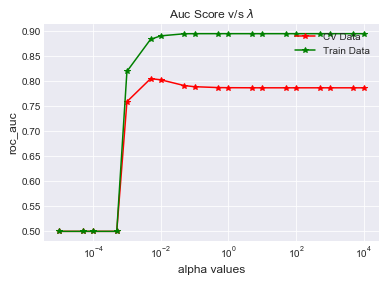

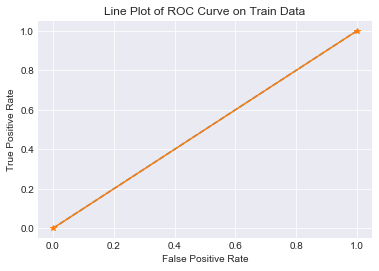

In [138]:
# find optimal_C using l1 regularization
logistic_l1(train_tfidfw2v,cv_tfidfw2v,Y_tr,Y_cv)

10000  for CV data auc score is -->  0.7870694266999735  and for train data auc score is -->  0.8952821246322495
5000  for CV data auc score is -->  0.787069534574246  and for train data auc score is -->  0.8952821283130452
1000  for CV data auc score is -->  0.7870703225254554  and for train data auc score is -->  0.8952821382228796
500  for CV data auc score is -->  0.7870715701148698  and for train data auc score is -->  0.8952821294455976
100  for CV data auc score is -->  0.787079909265167  and for train data auc score is -->  0.8952823485945066
50  for CV data auc score is -->  0.7870901502857934  and for train data auc score is -->  0.8952825382970504
10  for CV data auc score is -->  0.7871801010135627  and for train data auc score is -->  0.8952837761769337
5  for CV data auc score is -->  0.7872845279997078  and for train data auc score is -->  0.895284475811241
1  for CV data auc score is -->  0.7880851884397746  and for train data auc score is -->  0.8952929048332272
0.5  f

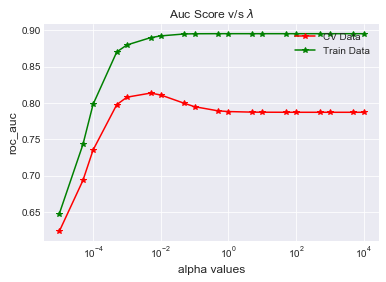

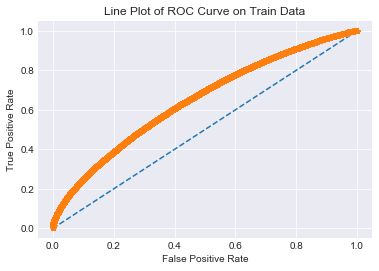

In [139]:
# find optimal_C using l1 regularization
logistic_l2(train_tfidfw2v,cv_tfidfw2v,Y_tr,Y_cv)

AUC Score 0.895310688455731
AUC Score 0.8018200100095967
macro f1 score for data : 0.6786163523815545
micro f1 scoore for data: 0.8351265217138055
hamming loss for data: 0.16487347828619453
Precision recall report for data:
              precision    recall  f1-score   support

          0       0.47      0.44      0.45     18943
          1       0.90      0.91      0.90    101234

avg / total       0.83      0.84      0.83    120177



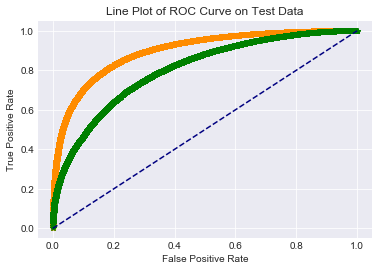

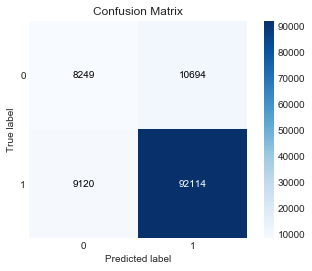

In [140]:
testing_l1(train_tfidfw2v,Y_tr,test_tfidfw2v,Y_test,optimal_C=0.1)

AUC Score 0.8952979316675016
AUC Score 0.8018407627368636
macro f1 score for data : 0.679056412145597
micro f1 scoore for data: 0.8347936793229985
hamming loss for data: 0.16520632067700142
Precision recall report for data:
              precision    recall  f1-score   support

          0       0.47      0.44      0.46     18943
          1       0.90      0.91      0.90    101234

avg / total       0.83      0.83      0.83    120177



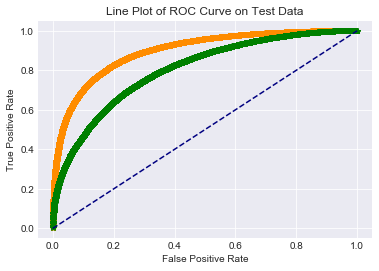

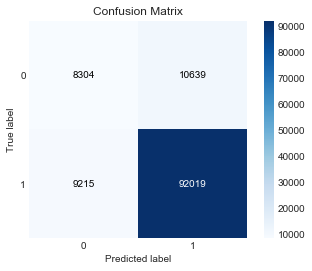

In [141]:

testing_l2(train_tfidfw2v,Y_tr,test_tfidfw2v,Y_test,optimal_C=0.5)

In [143]:
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Vectorizer", "Regularization", "Best Hyper Parameter(C)","Test Auc Score"]
x.add_row(["BoW","L1",5,95.62])
x.add_row(["BoW","L2",5,95.80])
x.add_row(["Tf-Idf","L1",5,96.88])
x.add_row(["Tf-Idf","L2",50,97.18])
x.add_row(["Avg-W2V","L1",0.1,86.74])
x.add_row(["Avg-W2V","L2",0.001,88.37])
x.add_row(["TfIdf-W2V","L1",0.005,80.52])
x.add_row(["TfIdf-W2V","L2",0.005,81.35])
from IPython.display import Markdown, display
def printmd(string):
    display(Markdown(string))
printmd('****Final Conclusion:****')
print(x)

****Final Conclusion:****

+------------+----------------+-------------------------+----------------+
| Vectorizer | Regularization | Best Hyper Parameter(C) | Test Auc Score |
+------------+----------------+-------------------------+----------------+
|    BoW     |       L1       |            5            |     95.62      |
|    BoW     |       L2       |            5            |      95.8      |
|   Tf-Idf   |       L1       |            5            |     96.88      |
|   Tf-Idf   |       L2       |            50           |     97.18      |
|  Avg-W2V   |       L1       |           0.1           |     86.74      |
|  Avg-W2V   |       L2       |          0.001          |     88.37      |
| TfIdf-W2V  |       L1       |          0.005          |     80.52      |
| TfIdf-W2V  |       L2       |          0.005          |     81.35      |
+------------+----------------+-------------------------+----------------+


# [6] Conclusions

In [0]:
TFIDF Featurization performs best with L2 Regularization and TEST AUC of 0.935.
Sparsity increases as we increase lambda or decrease C when L1 Regularizer is used. 